In [237]:
import os
from six import string_types
import numpy as np
import pandas as pd
from skimage import io
from glob import glob
from tqdm import tqdm
import cv2

from sklearn.decomposition import PCA
import umap.umap_ as umap
from sklearn.manifold import TSNE

import matplotlib.pyplot as plt
import plotly.offline as py
py.init_notebook_mode(connected=True)
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from PIL import Image

%matplotlib inline


In [238]:
TILE2VEC_ROOT = os.path.abspath("../data/")
TILE2VEC_DIR = os.path.join(TILE2VEC_ROOT, 'tile2vec_tiles')
TILE2VEC_LABEL = os.path.join(TILE2VEC_ROOT, 'tile2vec_y.npy')
assert os.path.exists(TILE2VEC_ROOT)
assert os.path.exists(TILE2VEC_DIR)
assert os.path.exists(TILE2VEC_LABEL)

In [239]:
# Load data and labels

y_train = np.load(TILE2VEC_LABEL)
print(y_train[:10])

[ 69.  69.  69.  69.  69. 176. 176. 123.  75.  75.]


In [240]:
# Print all unique classes
unique, counts = np.unique(y_train, return_counts=True)
print("Number of unique labels: ", len(unique))
dict(zip(unique, counts))


Number of unique labels:  28


{1.0: 2,
 2.0: 10,
 21.0: 1,
 24.0: 11,
 28.0: 2,
 36.0: 37,
 49.0: 5,
 54.0: 8,
 61.0: 58,
 69.0: 354,
 71.0: 2,
 72.0: 1,
 75.0: 167,
 76.0: 7,
 111.0: 5,
 121.0: 23,
 122.0: 25,
 123.0: 64,
 124.0: 5,
 152.0: 1,
 176.0: 173,
 204.0: 8,
 205.0: 2,
 208.0: 3,
 212.0: 11,
 217.0: 1,
 225.0: 13,
 236.0: 1}

In [241]:
def sample_images(label, n=None):
    imgs_list = []
    for idx in range(len(y_train)):
        if y_train[idx] == label:
            imgs_list.append(idx)
    if n is not None:
        return imgs_list[:n]
    else:
        return imgs_list

In [259]:
def load_image(idx):
    return np.load(os.path.join(TILE2VEC_DIR, '{}tile.npy'.format(idx+1)))[:,:,:3]

Label ID	Label
1	Corn
2	Cotton
21	Barley
24	Winter Wheat
28	Oats
36	Alfalfa
49	Onions
54	Tomatoes
61	Fallow/Idle Cropland
69	Grapes
71	Other Tree Crops
72	Citrus
75	Almonds
76	Walnuts
111	Open Water
121	Developed/Open Space
122	Developed/Low Intensity
123	Developed/Med Intensity
124	Developed/High Intensity
152	Shrubland
176	Grassland/Pasture
204	Pistachios
205	Triticale
208	Garlic
212	Oranges
217	Pomegranates
225	Dbl Crop WinWht/Corn
236	Dbl Crop WinWht/Sorghum

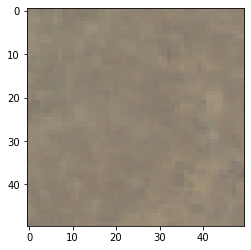

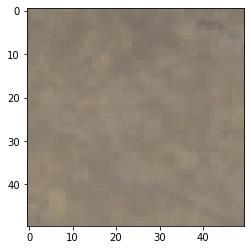

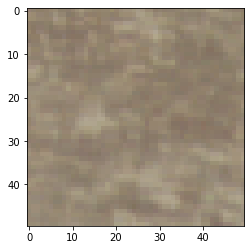

In [287]:
sampled_images = sample_images(176, n=3) #sample images in a given class

for a in sampled_images:

    try:
        jpg_img = load_image(a)[:,:,:3]
        fig = plt.figure()
        fig.set_size_inches(4, 4)
        plt.imshow(jpg_img)
    except:
        continue

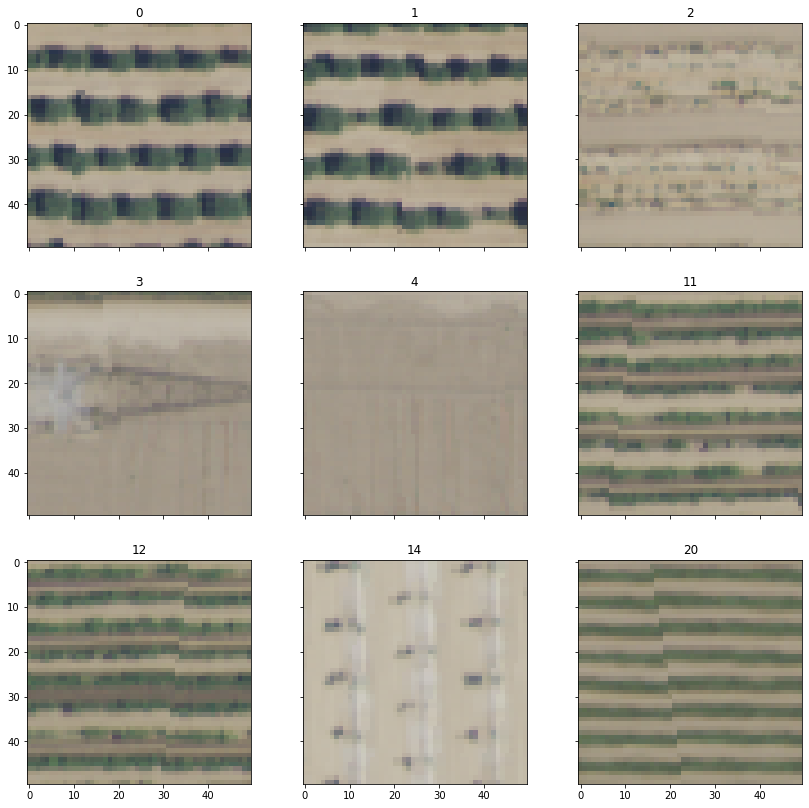

In [286]:
sampled_images = sample_images(69, n=9)
_, ax = plt.subplots(3, 3, sharex='col', sharey='row', figsize=(14, 14))

for i, a in enumerate(sampled_images):

    try:
        jpg_img = load_image(a)[:,:,:3]           
        ax[i // 3, i % 3].imshow(jpg_img)
        ax[i // 3, i % 3].set_title(a)
    except:
        continue

### Embeddings

In [64]:
#FEATURES_TILE2VEC = os.path.abspath("../data/features/tile2vec")

#features_bigearthnet = np.load(os.path.join(FEATURES_TILE2VEC, 'features_bigearthnet_tile2vec.npy'))
#features_EuroSAT = np.load(os.path.join(FEATURES_TILE2VEC, 'features_EuroSAT_tile2vec.npy'))
#features_ResNet50 = np.load(os.path.join(FEATURES_TILE2VEC, 'features_ImageNet-ResNet50_tile2vec.npy'))
#features_Resic45 = np.load(os.path.join(FEATURES_TILE2VEC, 'features_Resic-45_tile2vec.npy'))
#features_So2Sat = np.load(os.path.join(FEATURES_TILE2VEC, 'features_So2Sat_tile2vec.npy'))
#features_Tile2Vec = np.load(os.path.join(FEATURES_TILE2VEC, 'features_Tile2Vec_tile2vec.npy'))
#features_UCMerced = np.load(os.path.join(FEATURES_TILE2VEC, 'features_UC_Merced_tile2vec.npy'))
#features_InceptionV3 = np.load(os.path.join(FEATURES_TILE2VEC, 'features_InceptionV3_pool_tile2vec.npy'))

### t-SNE

In [12]:
#print(features_bigearthnet.shape)
#tsne_bigearthnet = TSNE(
#    n_components=2,
#    init='random', # pca
#    random_state=101,
#    method='barnes_hut',
#    n_iter=500,
#    verbose=2
#).fit_transform(features_bigearthnet)

In [43]:
TSNE_TILE2VEC = os.path.abspath("../data/features/tile2vec/TSNE")

tsne_bigearthnet = np.load(os.path.join(TSNE_TILE2VEC, 'tsne_bigearthnet_tile2vec.npy'))
tsne_EuroSAT = np.load(os.path.join(TSNE_TILE2VEC, 'tsne_EuroSAT_tile2vec.npy'))
tsne_ResNet50 = np.load(os.path.join(TSNE_TILE2VEC, 'tsne_ResNet50_tile2vec.npy'))
tsne_Resic45 = np.load(os.path.join(TSNE_TILE2VEC, 'tsne_Resic45_tile2vec.npy'))
tsne_So2Sat = np.load(os.path.join(TSNE_TILE2VEC, 'tsne_So2Sat_tile2vec.npy'))
tsne_Tile2Vec = np.load(os.path.join(TSNE_TILE2VEC, 'tsne_Tile2Vec_tile2vec.npy'))
tsne_UCMerced = np.load(os.path.join(TSNE_TILE2VEC, 'tsne_UCMerced_tile2vec.npy'))
tsne_InceptionV3 = np.load(os.path.join(TSNE_TILE2VEC, 'tsne_InceptionV3_tile2vec.npy'))
tsne_CannyEdgeSpace = np.load(os.path.join(TSNE_TILE2VEC, 'tsne_CannyEdgeSpace_tile2vec.npy'))
tsne_MeanColorSpace = np.load(os.path.join(TSNE_TILE2VEC, 'tsne_MeanColorSpace_tile2vec.npy'))

##### BigEarthNet

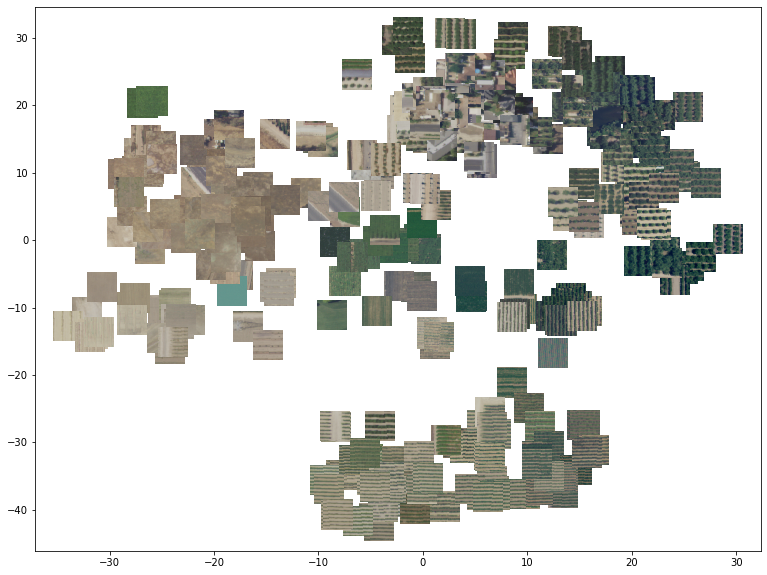

In [48]:
# Plot the subset of images in a two dimensional representation
n_imgs = 350
#img_shape = (256, 256)
img_shape = (300, 300)

def imscatter(x, y, images, ax=None, zoom=0.1):
    ax = plt.gca()
    images = [OffsetImage(image, zoom=zoom) for image in images]
    artists = []
    for x0, y0, im0 in zip(x, y, images):
        ab = AnnotationBbox(im0, (x0, y0), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(np.column_stack([x, y]))
    ax.autoscale()

plt.figure(figsize=(13,10))
imscatter(tsne_bigearthnet[0:n_imgs,0], tsne_bigearthnet[0:n_imgs,1], [cv2.resize(np.load(os.path.join(TILE2VEC_DIR, '{}tile.npy'.format(i+1)))[:,:,:3], img_shape) for i in range(n_imgs)])

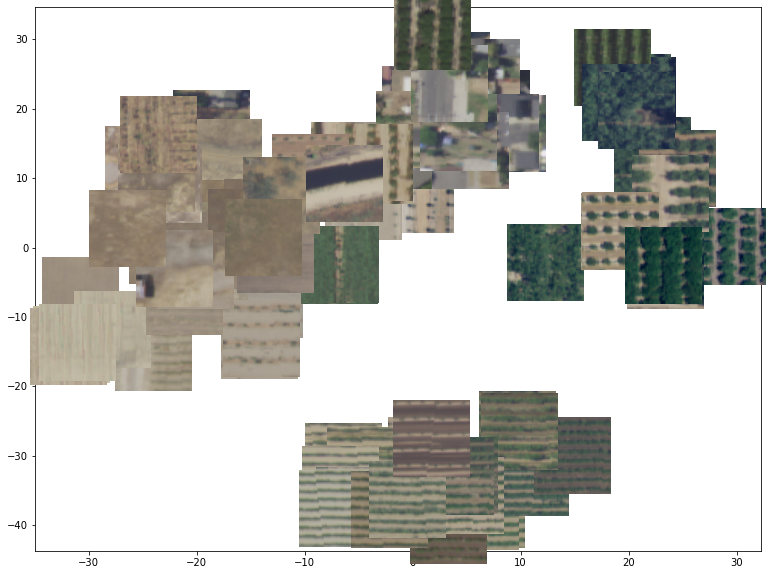

In [52]:
# Subset of images for clustering
n_imgs = 100
offset = 300
img_shape = (256, 256)

# Plot the subset of images in a two dimensional representation
def imscatter(x, y, images, ax=None, zoom=0.3):
    ax = plt.gca()
    images = [OffsetImage(image, zoom=zoom) for image in images]
    artists = []
    for x0, y0, im0 in zip(x, y, images):
        ab = AnnotationBbox(im0, (x0, y0), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(np.column_stack([x, y]))
    ax.autoscale()

plt.figure(figsize=(13,10))
imscatter(tsne_bigearthnet[offset:offset + n_imgs, 0], tsne_bigearthnet[offset:offset + n_imgs, 1], [cv2.resize(np.load(os.path.join(TILE2VEC_DIR, '{}tile.npy'.format(offset+i+1)))[:,:,:3], img_shape) for i in range(n_imgs)])

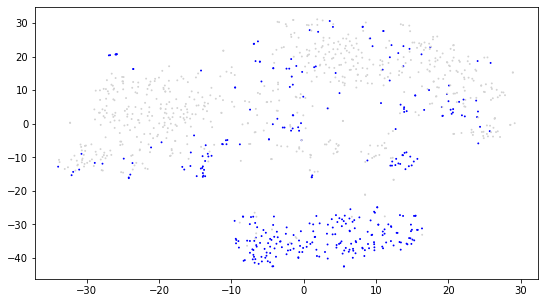

In [59]:
color = []
for i in range(len(y_train)):
    if y_train[i] == 69:
        color.append('b') #
    else:
        color.append('lightgrey') #other

plt.figure(figsize=(9,5))
plt.scatter(tsne_bigearthnet[:, 0], tsne_bigearthnet[:, 1], c=color, s=0.8, cmap='Scatter');

##### EuroSAT

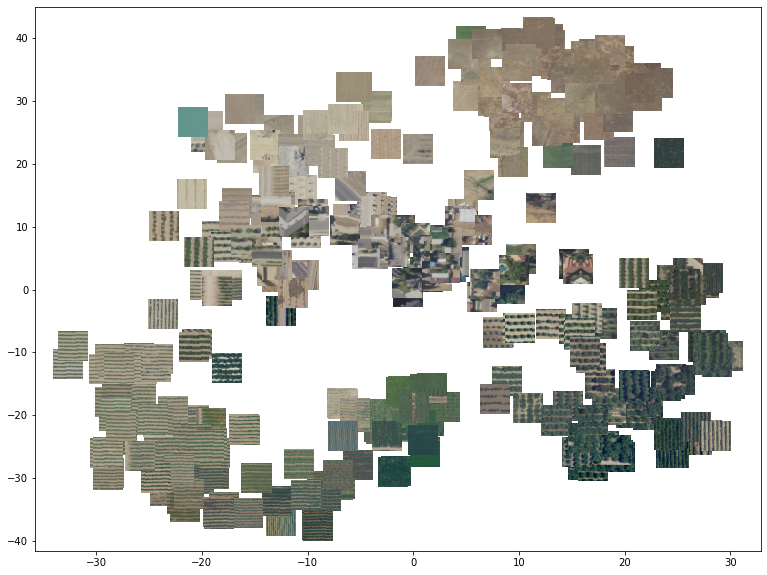

In [61]:
# Plot the subset of images in a two dimensional representation
n_imgs = 350
#img_shape = (256, 256)
img_shape = (300, 300)

def imscatter(x, y, images, ax=None, zoom=0.1):
    ax = plt.gca()
    images = [OffsetImage(image, zoom=zoom) for image in images]
    artists = []
    for x0, y0, im0 in zip(x, y, images):
        ab = AnnotationBbox(im0, (x0, y0), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(np.column_stack([x, y]))
    ax.autoscale()

plt.figure(figsize=(13,10))
imscatter(tsne_EuroSAT[0:n_imgs,0], tsne_EuroSAT[0:n_imgs,1], [cv2.resize(np.load(os.path.join(TILE2VEC_DIR, '{}tile.npy'.format(i+1)))[:,:,:3], img_shape) for i in range(n_imgs)])


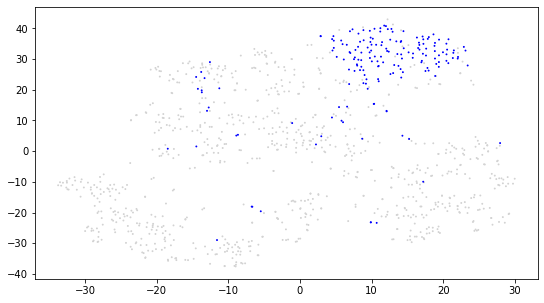

In [67]:
color = []
for i in range(len(y_train)):
    if y_train[i] == 176:
        color.append('b') #
    else:
        color.append('lightgrey') #other

plt.figure(figsize=(9,5))
plt.scatter(tsne_EuroSAT[:, 0], tsne_EuroSAT[:, 1], c=color, s=0.8, cmap='Scatter');

##### ResNet50

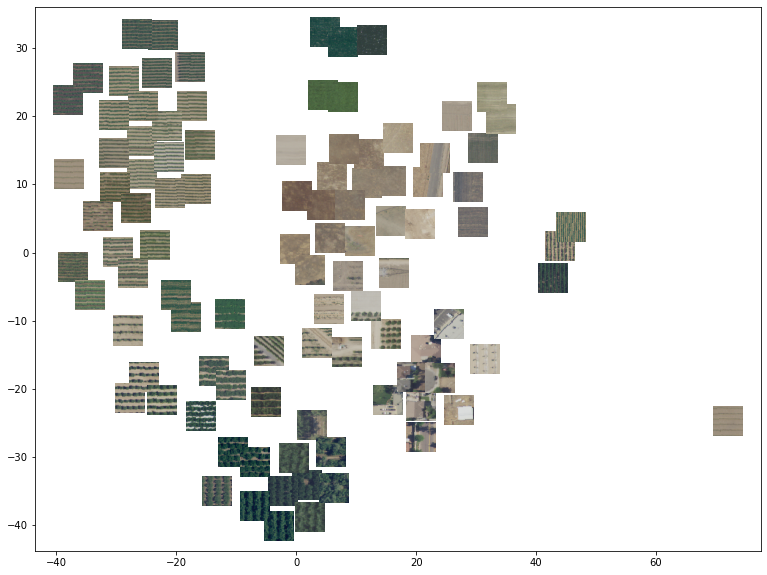

In [62]:
# Plot the subset of images in a two dimensional representation
n_imgs = 350
#img_shape = (256, 256)
img_shape = (300, 300)

def imscatter(x, y, images, ax=None, zoom=0.1):
    ax = plt.gca()
    images = [OffsetImage(image, zoom=zoom) for image in images]
    artists = []
    for x0, y0, im0 in zip(x, y, images):
        ab = AnnotationBbox(im0, (x0, y0), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(np.column_stack([x, y]))
    ax.autoscale()

plt.figure(figsize=(13,10))
imscatter(tsne_ResNet50[0:n_imgs,0], tsne_ResNet50[0:n_imgs,1], [cv2.resize(np.load(os.path.join(TILE2VEC_DIR, '{}tile.npy'.format(i+1)))[:,:,:3], img_shape) for i in range(n_imgs)])


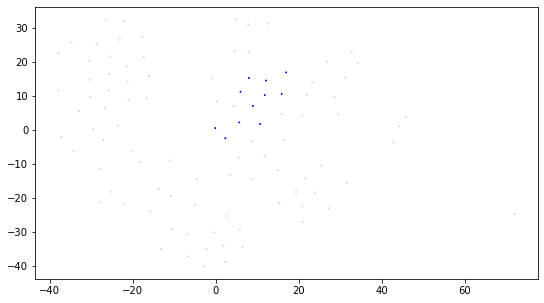

In [75]:
color = []
for i in range(len(y_train)):
    if y_train[i] == 176:
        color.append('b') #
    else:
        color.append('lightgrey') #other

plt.figure(figsize=(9,5))
plt.scatter(tsne_ResNet50[:, 0], tsne_ResNet50[:, 1], c=color[:100], s=0.8, cmap='Scatter');

##### Resic45

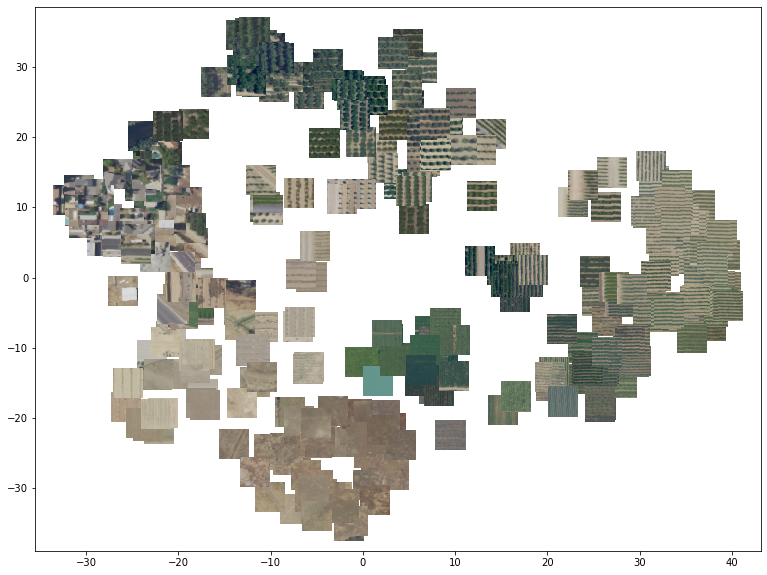

In [63]:
# Plot the subset of images in a two dimensional representation
n_imgs = 350
#img_shape = (256, 256)
img_shape = (300, 300)

def imscatter(x, y, images, ax=None, zoom=0.1):
    ax = plt.gca()
    images = [OffsetImage(image, zoom=zoom) for image in images]
    artists = []
    for x0, y0, im0 in zip(x, y, images):
        ab = AnnotationBbox(im0, (x0, y0), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(np.column_stack([x, y]))
    ax.autoscale()

plt.figure(figsize=(13,10))
imscatter(tsne_Resic45[0:n_imgs,0], tsne_Resic45[0:n_imgs,1], [cv2.resize(np.load(os.path.join(TILE2VEC_DIR, '{}tile.npy'.format(i+1)))[:,:,:3], img_shape) for i in range(n_imgs)])


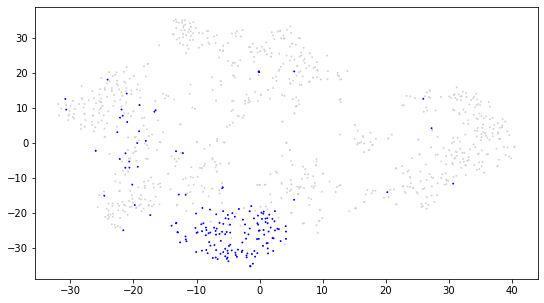

In [71]:
color = []
for i in range(len(y_train)):
    if y_train[i] == 176:
        color.append('b') #
    else:
        color.append('lightgrey') #other

plt.figure(figsize=(9,5))
plt.scatter(tsne_Resic45[:, 0], tsne_Resic45[:, 1], c=color, s=0.8, cmap='Scatter');

##### So2Sat

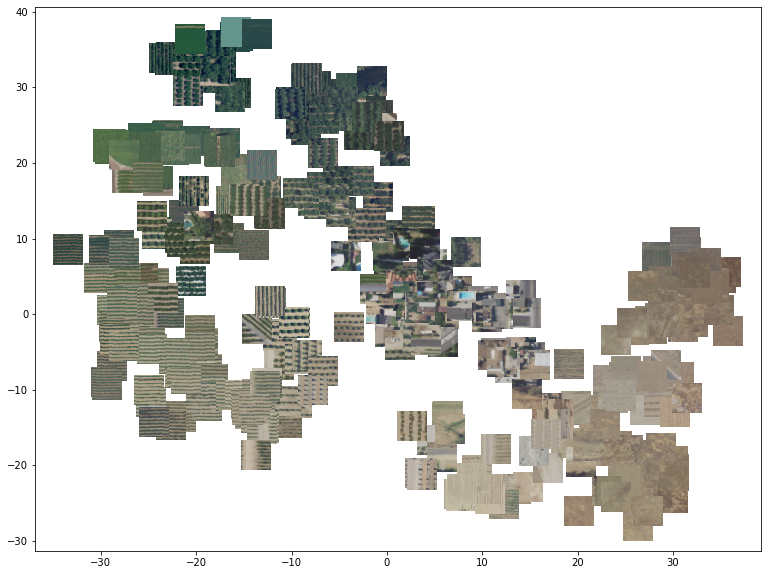

In [76]:
# Plot the subset of images in a two dimensional representation
n_imgs = 350
#img_shape = (256, 256)
img_shape = (300, 300)

def imscatter(x, y, images, ax=None, zoom=0.1):
    ax = plt.gca()
    images = [OffsetImage(image, zoom=zoom) for image in images]
    artists = []
    for x0, y0, im0 in zip(x, y, images):
        ab = AnnotationBbox(im0, (x0, y0), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(np.column_stack([x, y]))
    ax.autoscale()

plt.figure(figsize=(13,10))
imscatter(tsne_So2Sat[0:n_imgs,0], tsne_So2Sat[0:n_imgs,1], [cv2.resize(np.load(os.path.join(TILE2VEC_DIR, '{}tile.npy'.format(i+1)))[:,:,:3], img_shape) for i in range(n_imgs)])

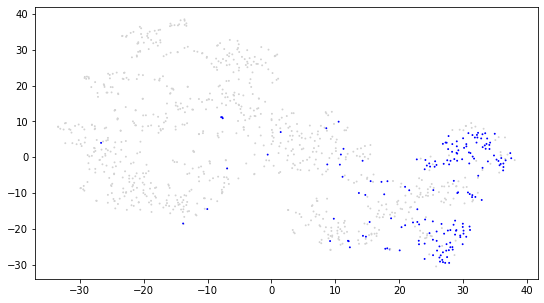

In [80]:
color = []
for i in range(len(y_train)):
    if y_train[i] == 176:
        color.append('b') #
    else:
        color.append('lightgrey') #other

plt.figure(figsize=(9,5))
plt.scatter(tsne_So2Sat[:, 0], tsne_So2Sat[:, 1], c=color, s=0.8, cmap='Scatter');

##### Tile2Vec

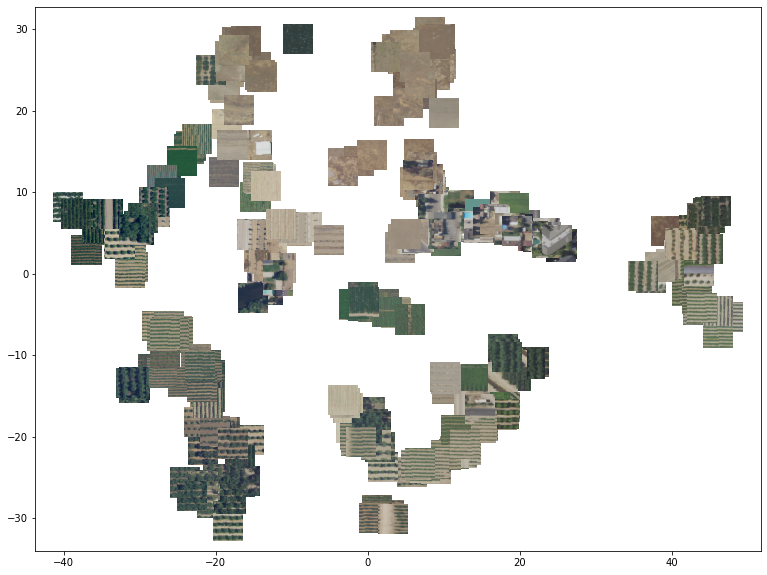

In [81]:
# Plot the subset of images in a two dimensional representation
n_imgs = 350
#img_shape = (256, 256)
img_shape = (300, 300)

def imscatter(x, y, images, ax=None, zoom=0.1):
    ax = plt.gca()
    images = [OffsetImage(image, zoom=zoom) for image in images]
    artists = []
    for x0, y0, im0 in zip(x, y, images):
        ab = AnnotationBbox(im0, (x0, y0), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(np.column_stack([x, y]))
    ax.autoscale()

plt.figure(figsize=(13,10))
imscatter(tsne_Tile2Vec[0:n_imgs,0], tsne_Tile2Vec[0:n_imgs,1], [cv2.resize(np.load(os.path.join(TILE2VEC_DIR, '{}tile.npy'.format(i+1)))[:,:,:3], img_shape) for i in range(n_imgs)])

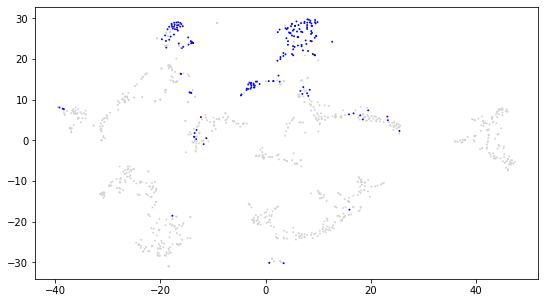

In [84]:
color = []
for i in range(len(y_train)):
    if y_train[i] == 176:
        color.append('b') #
    else:
        color.append('lightgrey') #other

plt.figure(figsize=(9,5))
plt.scatter(tsne_Tile2Vec[:, 0], tsne_Tile2Vec[:, 1], c=color, s=0.8, cmap='Scatter');

##### UC Merced

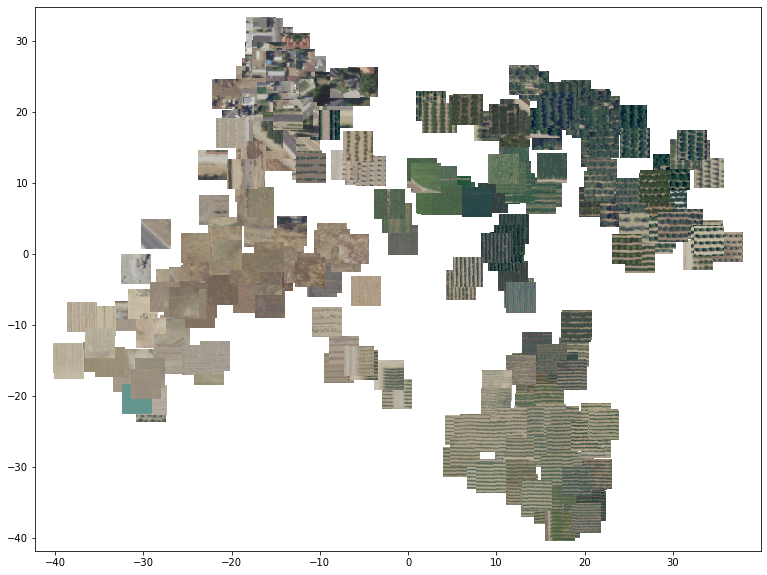

In [85]:
# Plot the subset of images in a two dimensional representation
n_imgs = 350
#img_shape = (256, 256)
img_shape = (300, 300)

def imscatter(x, y, images, ax=None, zoom=0.1):
    ax = plt.gca()
    images = [OffsetImage(image, zoom=zoom) for image in images]
    artists = []
    for x0, y0, im0 in zip(x, y, images):
        ab = AnnotationBbox(im0, (x0, y0), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(np.column_stack([x, y]))
    ax.autoscale()

plt.figure(figsize=(13,10))
imscatter(tsne_UCMerced[0:n_imgs,0], tsne_UCMerced[0:n_imgs,1], [cv2.resize(np.load(os.path.join(TILE2VEC_DIR, '{}tile.npy'.format(i+1)))[:,:,:3], img_shape) for i in range(n_imgs)])

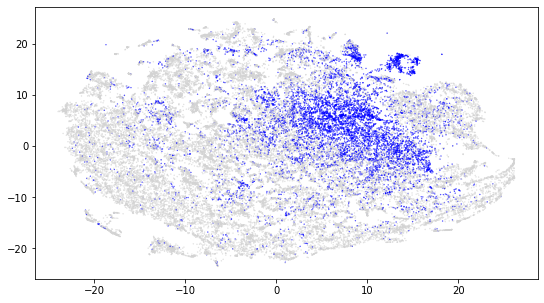

In [22]:
color = []
for i in range(len(y_train)):
    if y_train[i] == 176:
        color.append('b') #
    else:
        color.append('lightgrey') #other

plt.figure(figsize=(9,5))
plt.scatter(tsne_UCMerced[:, 0], tsne_UCMerced[:, 1], c=color, s=0.8, cmap='Scatter');

##### Inception V3

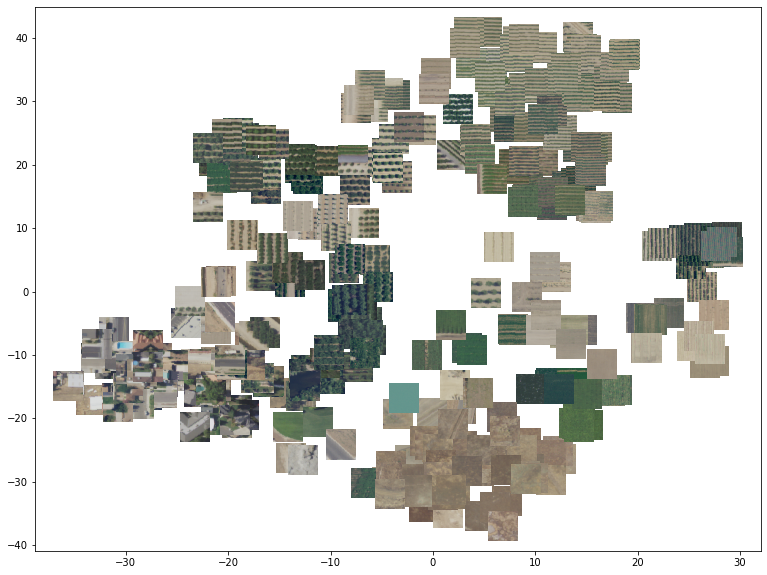

In [86]:
# Plot the subset of images in a two dimensional representation
n_imgs = 350
#img_shape = (256, 256)
img_shape = (300, 300)

def imscatter(x, y, images, ax=None, zoom=0.1):
    ax = plt.gca()
    images = [OffsetImage(image, zoom=zoom) for image in images]
    artists = []
    for x0, y0, im0 in zip(x, y, images):
        ab = AnnotationBbox(im0, (x0, y0), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(np.column_stack([x, y]))
    ax.autoscale()

plt.figure(figsize=(13,10))
imscatter(tsne_InceptionV3[0:n_imgs,0], tsne_InceptionV3[0:n_imgs,1], [cv2.resize(np.load(os.path.join(TILE2VEC_DIR, '{}tile.npy'.format(i+1)))[:,:,:3], img_shape) for i in range(n_imgs)])

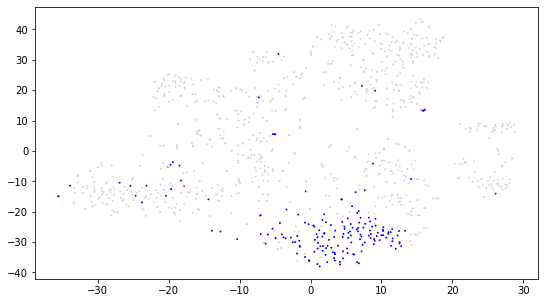

In [88]:
color = []
for i in range(len(y_train)):
    if y_train[i] == 176:
        color.append('b') #
    else:
        color.append('lightgrey') #other

plt.figure(figsize=(9,5))
plt.scatter(tsne_InceptionV3[:, 0], tsne_InceptionV3[:, 1], c=color, s=0.8, cmap='Scatter');

##### Canny Edge Space

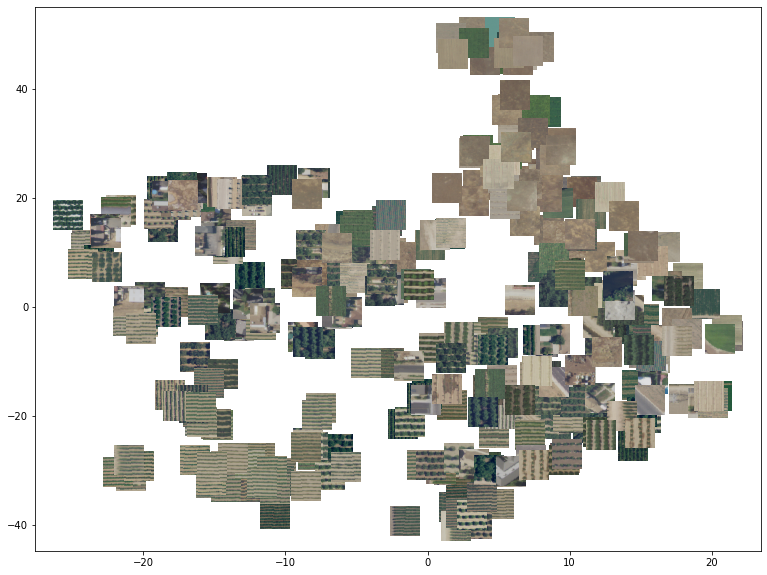

In [89]:
# Plot the subset of images in a two dimensional representation
n_imgs = 350
#img_shape = (256, 256)
img_shape = (300, 300)

def imscatter(x, y, images, ax=None, zoom=0.1):
    ax = plt.gca()
    images = [OffsetImage(image, zoom=zoom) for image in images]
    artists = []
    for x0, y0, im0 in zip(x, y, images):
        ab = AnnotationBbox(im0, (x0, y0), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(np.column_stack([x, y]))
    ax.autoscale()

plt.figure(figsize=(13,10))
imscatter(tsne_CannyEdgeSpace[0:n_imgs,0], tsne_CannyEdgeSpace[0:n_imgs,1], [cv2.resize(np.load(os.path.join(TILE2VEC_DIR, '{}tile.npy'.format(i+1)))[:,:,:3], img_shape) for i in range(n_imgs)])

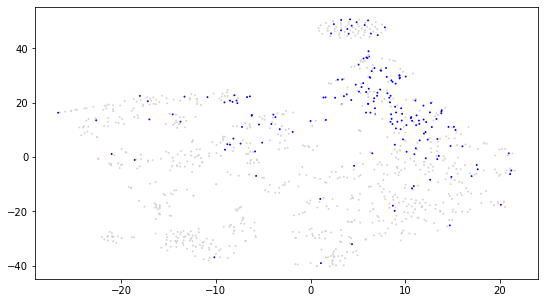

In [91]:
color = []
for i in range(len(y_train)):
    if y_train[i] == 176:
        color.append('b') #
    else:
        color.append('lightgrey') #other

plt.figure(figsize=(9,5))
plt.scatter(tsne_CannyEdgeSpace[:, 0], tsne_CannyEdgeSpace[:, 1], c=color, s=0.8, cmap='Scatter');

##### Mean Color Space

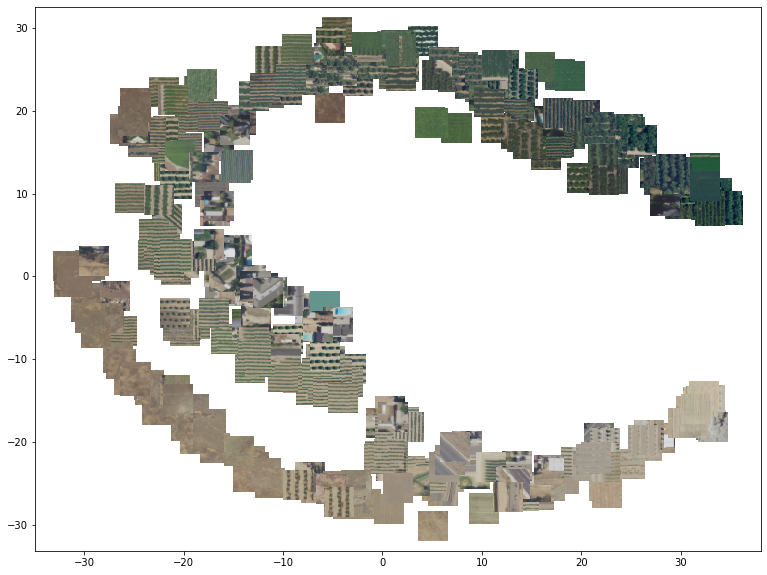

In [92]:
# Plot the subset of images in a two dimensional representation
n_imgs = 350
#img_shape = (256, 256)
img_shape = (300, 300)

def imscatter(x, y, images, ax=None, zoom=0.1):
    ax = plt.gca()
    images = [OffsetImage(image, zoom=zoom) for image in images]
    artists = []
    for x0, y0, im0 in zip(x, y, images):
        ab = AnnotationBbox(im0, (x0, y0), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(np.column_stack([x, y]))
    ax.autoscale()

plt.figure(figsize=(13,10))
imscatter(tsne_MeanColorSpace[0:n_imgs,0], tsne_MeanColorSpace[0:n_imgs,1], [cv2.resize(np.load(os.path.join(TILE2VEC_DIR, '{}tile.npy'.format(i+1)))[:,:,:3], img_shape) for i in range(n_imgs)])

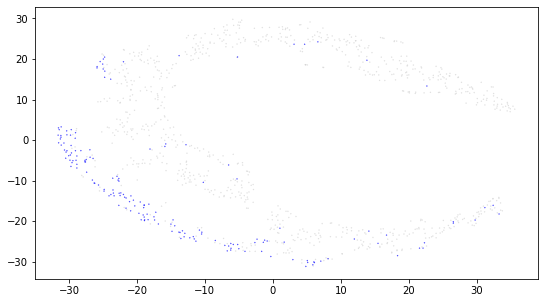

In [93]:
color = []
for i in range(len(y_train)):
    if y_train[i] == 176:
        color.append('b') #
    else:
        color.append('lightgrey') #other

plt.figure(figsize=(9,5))
plt.scatter(tsne_MeanColorSpace[:, 0], tsne_MeanColorSpace[:, 1], c=color, s=0.8, cmap='Scatter');

### PCA

In [27]:
#pca_bigearthnet = PCA(n_components=2).fit_transform(features_bigearthnet)

In [96]:
PCA_TILE2VEC = os.path.abspath("../data/features/tile2vec/PCA")

pca_bigearthnet = np.load(os.path.join(PCA_TILE2VEC, 'pca_bigearthnet_tile2vec.npy'))
pca_EuroSAT = np.load(os.path.join(PCA_TILE2VEC, 'pca_EuroSAT_tile2vec.npy'))
pca_ResNet50 = np.load(os.path.join(PCA_TILE2VEC, 'pca_ResNet50_tile2vec.npy'))
pca_Resic45 = np.load(os.path.join(PCA_TILE2VEC, 'pca_Resic45_tile2vec.npy'))
pca_So2Sat = np.load(os.path.join(PCA_TILE2VEC, 'pca_So2Sat_tile2vec.npy'))
pca_Tile2Vec = np.load(os.path.join(PCA_TILE2VEC, 'pca_Tile2Vec_tile2vec.npy'))
pca_UCMerced = np.load(os.path.join(PCA_TILE2VEC, 'pca_UCMerced_tile2vec.npy'))
pca_InceptionV3 = np.load(os.path.join(PCA_TILE2VEC, 'pca_InceptionV3_tile2vec.npy'))
pca_CannyEdgeSpace = np.load(os.path.join(PCA_TILE2VEC, 'pca_CannyEdgeSpace_tile2vec.npy'))
pca_MeanColorSpace = np.load(os.path.join(PCA_TILE2VEC, 'pca_MeanColorSpace_tile2vec.npy'))

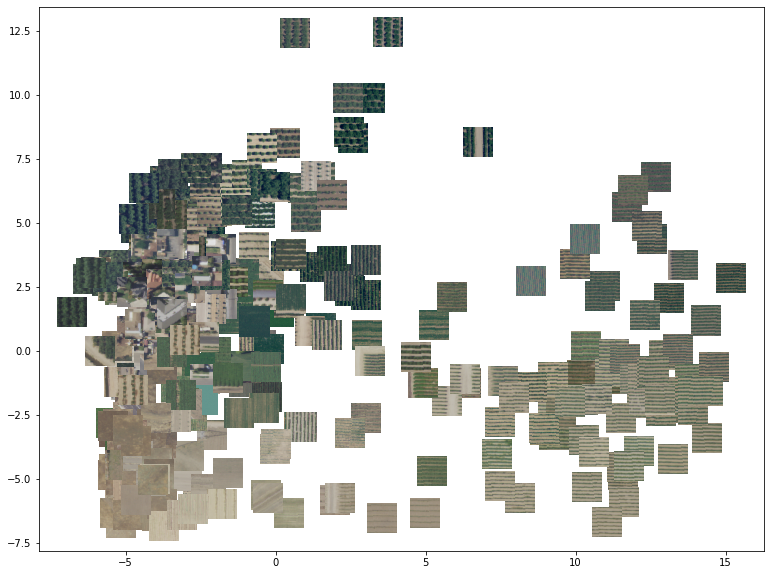

In [98]:
# Plot the subset of images in a two dimensional representation
n_imgs = 350
#img_shape = (256, 256)
img_shape = (300, 300)

def imscatter(x, y, images, ax=None, zoom=0.1):
    ax = plt.gca()
    images = [OffsetImage(image, zoom=zoom) for image in images]
    artists = []
    for x0, y0, im0 in zip(x, y, images):
        ab = AnnotationBbox(im0, (x0, y0), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(np.column_stack([x, y]))
    ax.autoscale()

plt.figure(figsize=(13,10))
imscatter(pca_bigearthnet[0:n_imgs,0], pca_bigearthnet[0:n_imgs,1], [cv2.resize(np.load(os.path.join(TILE2VEC_DIR, '{}tile.npy'.format(i+1)))[:,:,:3], img_shape) for i in range(n_imgs)])

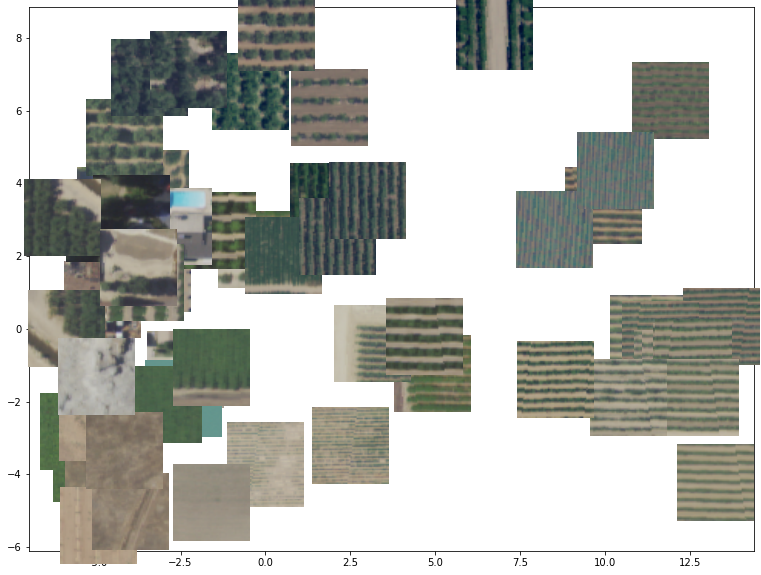

In [100]:
# Subset of images for clustering
n_imgs = 60
offset = 200
img_shape = (256, 256)


# Plot the subset of images in a two dimensional representation
def imscatter(x, y, images, ax=None, zoom=0.3):
    ax = plt.gca()
    images = [OffsetImage(image, zoom=zoom) for image in images]
    artists = []
    for x0, y0, im0 in zip(x, y, images):
        ab = AnnotationBbox(im0, (x0, y0), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(np.column_stack([x, y]))
    ax.autoscale()

plt.figure(figsize=(13,10))
imscatter(pca_bigearthnet[offset:offset + n_imgs, 0], pca_bigearthnet[offset:offset + n_imgs, 1], [cv2.resize(np.load(os.path.join(TILE2VEC_DIR, '{}tile.npy'.format(offset+i+1)))[:,:,:3], img_shape) for i in range(n_imgs)])

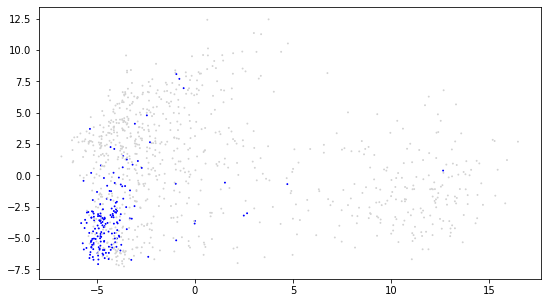

In [102]:
color = []
for i in range(len(y_train)):
    if y_train[i] == 176:
        color.append('b') #
    else:
        color.append('lightgrey') #other

plt.figure(figsize=(9,5))
plt.scatter(pca_bigearthnet[:, 0], pca_bigearthnet[:, 1], c=color, s=0.8, cmap='Scatter');

##### EuroSAT

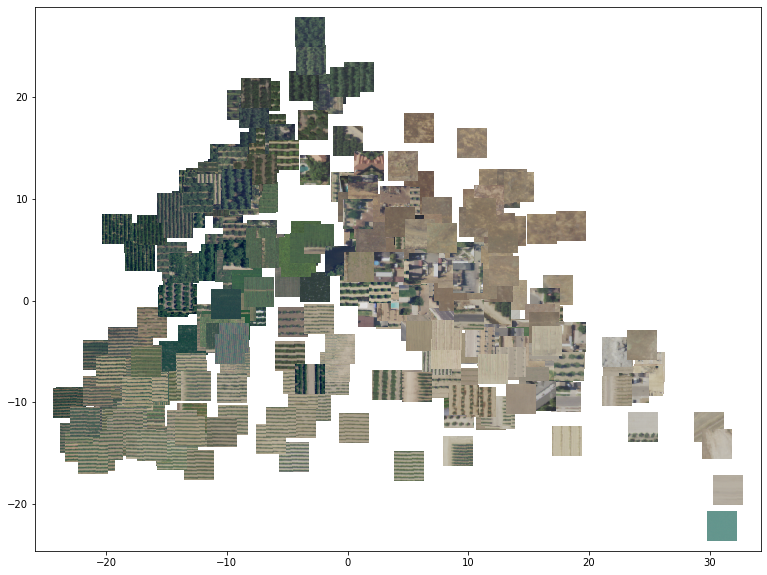

In [105]:
# Plot the subset of images in a two dimensional representation
n_imgs = 350
#img_shape = (256, 256)
img_shape = (300, 300)

def imscatter(x, y, images, ax=None, zoom=0.1):
    ax = plt.gca()
    images = [OffsetImage(image, zoom=zoom) for image in images]
    artists = []
    for x0, y0, im0 in zip(x, y, images):
        ab = AnnotationBbox(im0, (x0, y0), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(np.column_stack([x, y]))
    ax.autoscale()

plt.figure(figsize=(13,10))
imscatter(pca_EuroSAT[0:n_imgs,0], pca_EuroSAT[0:n_imgs,1], [cv2.resize(np.load(os.path.join(TILE2VEC_DIR, '{}tile.npy'.format(i+1)))[:,:,:3], img_shape) for i in range(n_imgs)])

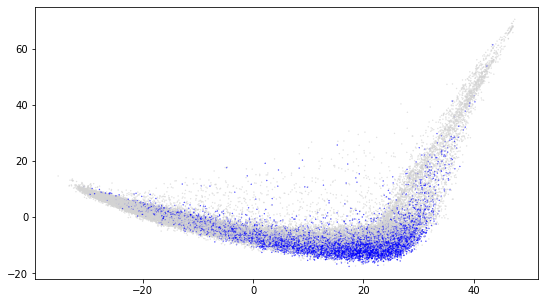

In [32]:
color = []
for i in range(len(y_train)):
    if y_train[i] == 176:
        color.append('b') #
    else:
        color.append('lightgrey') #other

plt.figure(figsize=(9,5))
plt.scatter(pca_EuroSAT[:, 0], pca_EuroSAT[:, 1], c=color, s=0.8, cmap='Scatter');

##### ResNet50

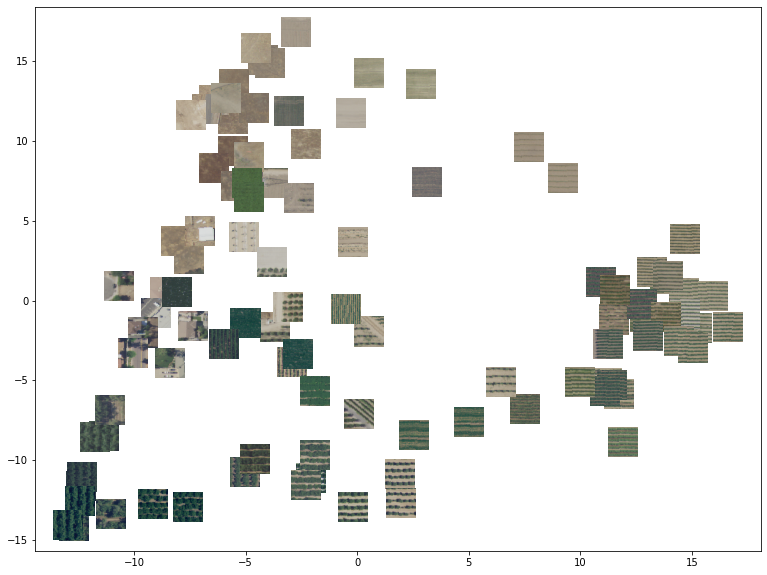

In [106]:
# Plot the subset of images in a two dimensional representation
n_imgs = 350
#img_shape = (256, 256)
img_shape = (300, 300)

def imscatter(x, y, images, ax=None, zoom=0.1):
    ax = plt.gca()
    images = [OffsetImage(image, zoom=zoom) for image in images]
    artists = []
    for x0, y0, im0 in zip(x, y, images):
        ab = AnnotationBbox(im0, (x0, y0), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(np.column_stack([x, y]))
    ax.autoscale()

plt.figure(figsize=(13,10))
imscatter(pca_ResNet50[0:n_imgs,0], pca_ResNet50[0:n_imgs,1], [cv2.resize(np.load(os.path.join(TILE2VEC_DIR, '{}tile.npy'.format(i+1)))[:,:,:3], img_shape) for i in range(n_imgs)])

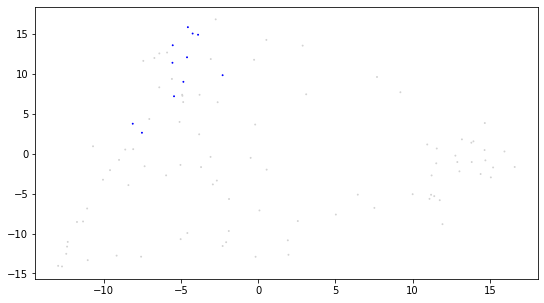

In [109]:
color = []
for i in range(len(y_train)):
    if y_train[i] == 176:
        color.append('b') #
    else:
        color.append('lightgrey') #other

plt.figure(figsize=(9,5))
plt.scatter(pca_ResNet50[:, 0], pca_ResNet50[:, 1], c=color[:100], s=0.8, cmap='Scatter');

##### Resic45

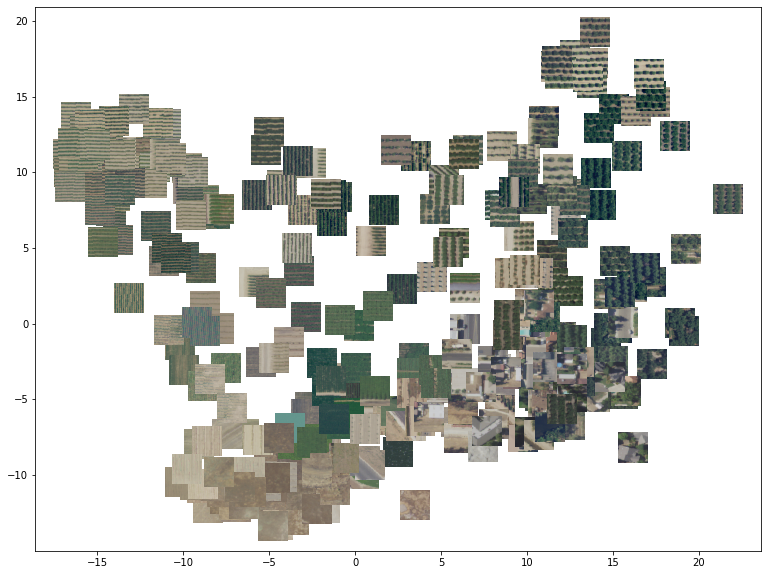

In [110]:
# Plot the subset of images in a two dimensional representation
n_imgs = 350
#img_shape = (256, 256)
img_shape = (300, 300)

def imscatter(x, y, images, ax=None, zoom=0.1):
    ax = plt.gca()
    images = [OffsetImage(image, zoom=zoom) for image in images]
    artists = []
    for x0, y0, im0 in zip(x, y, images):
        ab = AnnotationBbox(im0, (x0, y0), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(np.column_stack([x, y]))
    ax.autoscale()

plt.figure(figsize=(13,10))
imscatter(pca_Resic45[0:n_imgs,0], pca_Resic45[0:n_imgs,1], [cv2.resize(np.load(os.path.join(TILE2VEC_DIR, '{}tile.npy'.format(i+1)))[:,:,:3], img_shape) for i in range(n_imgs)])

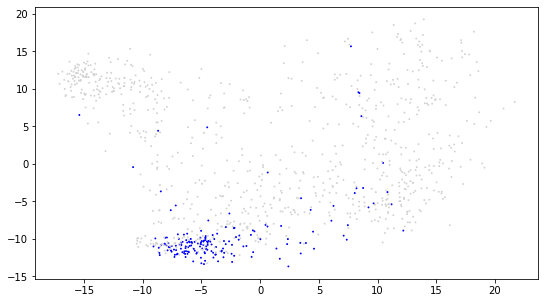

In [111]:
color = []
for i in range(len(y_train)):
    if y_train[i] == 176:
        color.append('b') #
    else:
        color.append('lightgrey') #other

plt.figure(figsize=(9,5))
plt.scatter(pca_Resic45[:, 0], pca_Resic45[:, 1], c=color, s=0.8, cmap='Scatter');

##### So2Sat

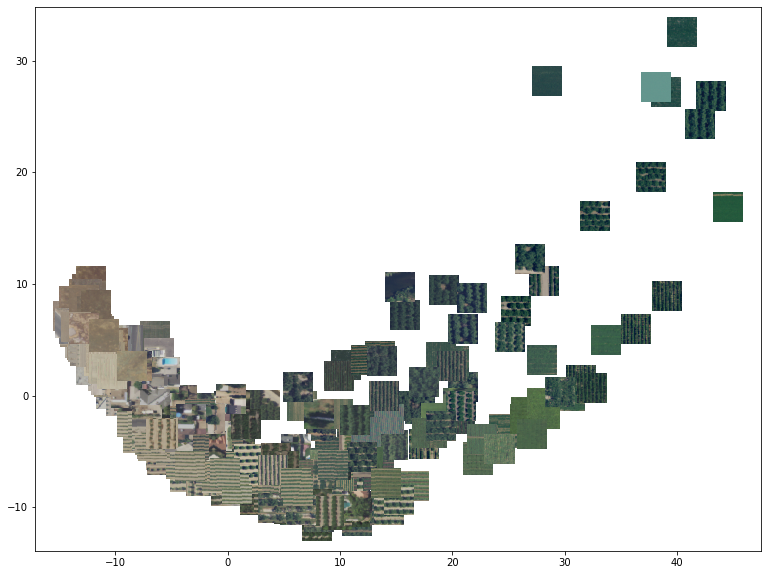

In [112]:
# Plot the subset of images in a two dimensional representation
n_imgs = 350
#img_shape = (256, 256)
img_shape = (300, 300)

def imscatter(x, y, images, ax=None, zoom=0.1):
    ax = plt.gca()
    images = [OffsetImage(image, zoom=zoom) for image in images]
    artists = []
    for x0, y0, im0 in zip(x, y, images):
        ab = AnnotationBbox(im0, (x0, y0), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(np.column_stack([x, y]))
    ax.autoscale()

plt.figure(figsize=(13,10))
imscatter(pca_So2Sat[0:n_imgs,0], pca_So2Sat[0:n_imgs,1], [cv2.resize(np.load(os.path.join(TILE2VEC_DIR, '{}tile.npy'.format(i+1)))[:,:,:3], img_shape) for i in range(n_imgs)])

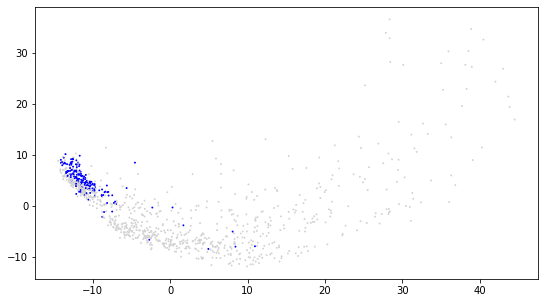

In [113]:
color = []
for i in range(len(y_train)):
    if y_train[i] == 176:
        color.append('b') #
    else:
        color.append('lightgrey') #other

plt.figure(figsize=(9,5))
plt.scatter(pca_So2Sat[:, 0], pca_So2Sat[:, 1], c=color, s=0.8, cmap='Scatter');

##### Tile2Vec

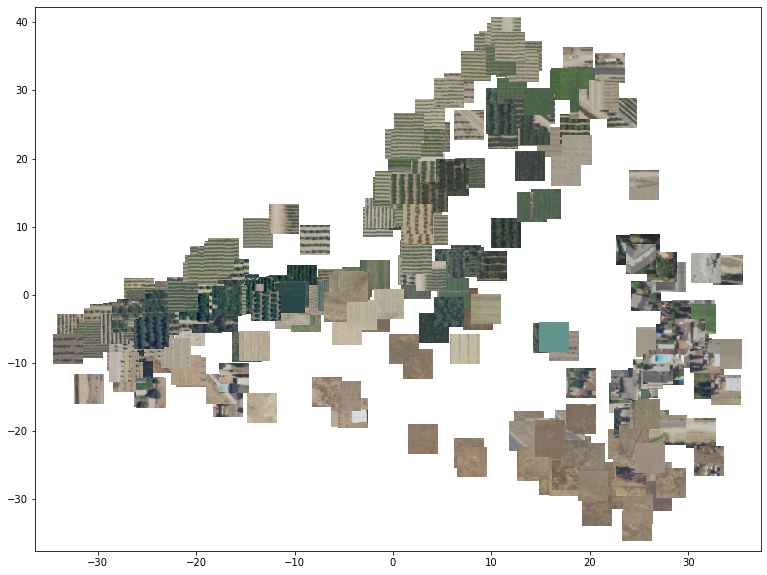

In [114]:
# Plot the subset of images in a two dimensional representation
n_imgs = 350
#img_shape = (256, 256)
img_shape = (300, 300)

def imscatter(x, y, images, ax=None, zoom=0.1):
    ax = plt.gca()
    images = [OffsetImage(image, zoom=zoom) for image in images]
    artists = []
    for x0, y0, im0 in zip(x, y, images):
        ab = AnnotationBbox(im0, (x0, y0), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(np.column_stack([x, y]))
    ax.autoscale()

plt.figure(figsize=(13,10))
imscatter(pca_Tile2Vec[0:n_imgs,0], pca_Tile2Vec[0:n_imgs,1], [cv2.resize(np.load(os.path.join(TILE2VEC_DIR, '{}tile.npy'.format(i+1)))[:,:,:3], img_shape) for i in range(n_imgs)])

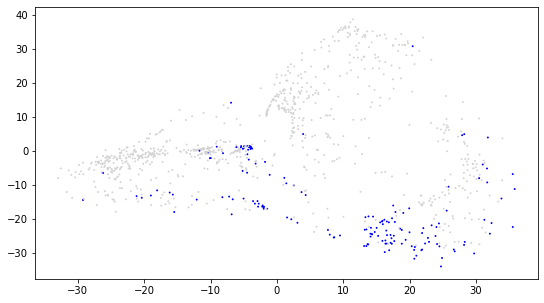

In [115]:
color = []
for i in range(len(y_train)):
    if y_train[i] == 176:
        color.append('b') #
    else:
        color.append('lightgrey') #other

plt.figure(figsize=(9,5))
plt.scatter(pca_Tile2Vec[:, 0], pca_Tile2Vec[:, 1], c=color, s=0.8, cmap='Scatter');

##### UC Merced

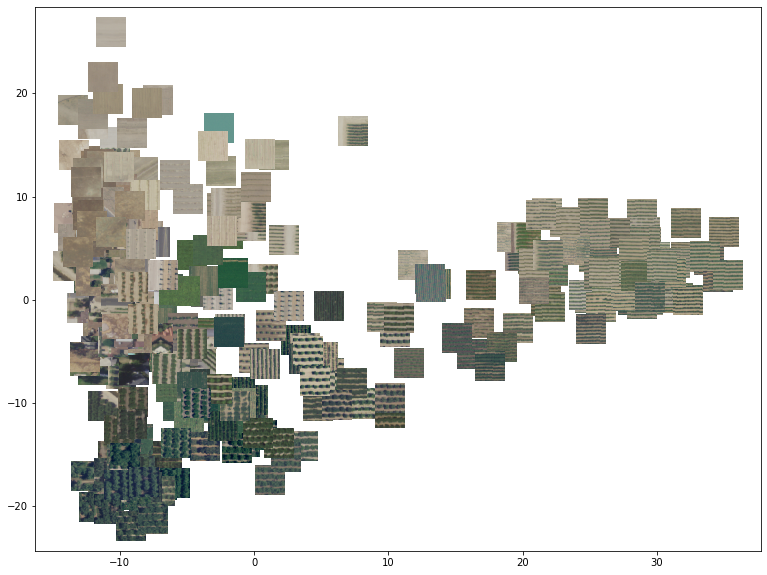

In [116]:
# Plot the subset of images in a two dimensional representation
n_imgs = 350
#img_shape = (256, 256)
img_shape = (300, 300)

def imscatter(x, y, images, ax=None, zoom=0.1):
    ax = plt.gca()
    images = [OffsetImage(image, zoom=zoom) for image in images]
    artists = []
    for x0, y0, im0 in zip(x, y, images):
        ab = AnnotationBbox(im0, (x0, y0), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(np.column_stack([x, y]))
    ax.autoscale()

plt.figure(figsize=(13,10))
imscatter(pca_UCMerced[0:n_imgs,0], pca_UCMerced[0:n_imgs,1], [cv2.resize(np.load(os.path.join(TILE2VEC_DIR, '{}tile.npy'.format(i+1)))[:,:,:3], img_shape) for i in range(n_imgs)])

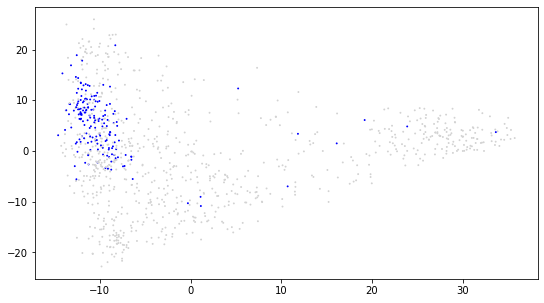

In [117]:
color = []
for i in range(len(y_train)):
    if y_train[i] == 176:
        color.append('b') #
    else:
        color.append('lightgrey') #other

plt.figure(figsize=(9,5))
plt.scatter(pca_UCMerced[:, 0], pca_UCMerced[:, 1], c=color, s=0.8, cmap='Scatter');

##### InceptionV3

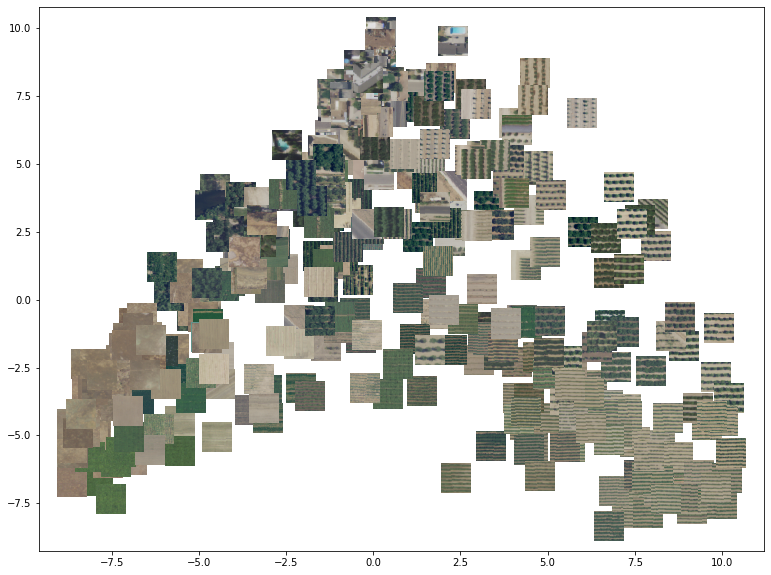

In [118]:
# Plot the subset of images in a two dimensional representation
n_imgs = 350
#img_shape = (256, 256)
img_shape = (300, 300)

def imscatter(x, y, images, ax=None, zoom=0.1):
    ax = plt.gca()
    images = [OffsetImage(image, zoom=zoom) for image in images]
    artists = []
    for x0, y0, im0 in zip(x, y, images):
        ab = AnnotationBbox(im0, (x0, y0), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(np.column_stack([x, y]))
    ax.autoscale()

plt.figure(figsize=(13,10))
imscatter(pca_InceptionV3[0:n_imgs,0], pca_InceptionV3[0:n_imgs,1], [cv2.resize(np.load(os.path.join(TILE2VEC_DIR, '{}tile.npy'.format(i+1)))[:,:,:3], img_shape) for i in range(n_imgs)])

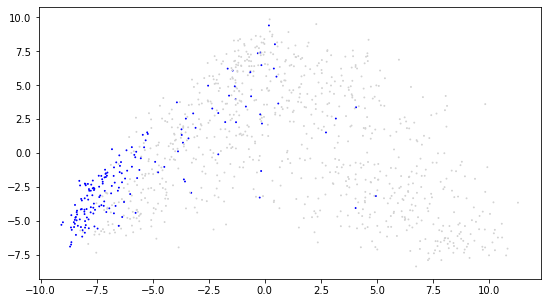

In [119]:
color = []
for i in range(len(y_train)):
    if y_train[i] == 176:
        color.append('b') #
    else:
        color.append('lightgrey') #other

plt.figure(figsize=(9,5))
plt.scatter(pca_InceptionV3[:, 0], pca_InceptionV3[:, 1], c=color, s=0.8, cmap='Scatter');

##### CannyEdgeSpace

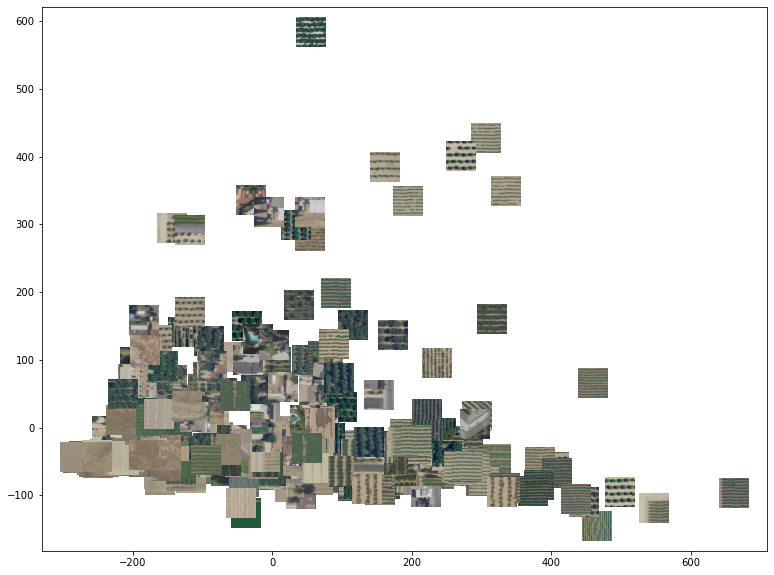

In [120]:
# Plot the subset of images in a two dimensional representation
n_imgs = 350
#img_shape = (256, 256)
img_shape = (300, 300)

def imscatter(x, y, images, ax=None, zoom=0.1):
    ax = plt.gca()
    images = [OffsetImage(image, zoom=zoom) for image in images]
    artists = []
    for x0, y0, im0 in zip(x, y, images):
        ab = AnnotationBbox(im0, (x0, y0), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(np.column_stack([x, y]))
    ax.autoscale()

plt.figure(figsize=(13,10))
imscatter(pca_CannyEdgeSpace[0:n_imgs,0], pca_CannyEdgeSpace[0:n_imgs,1], [cv2.resize(np.load(os.path.join(TILE2VEC_DIR, '{}tile.npy'.format(i+1)))[:,:,:3], img_shape) for i in range(n_imgs)])

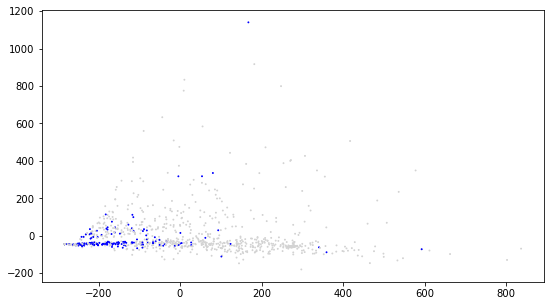

In [121]:
color = []
for i in range(len(y_train)):
    if y_train[i] == 176:
        color.append('b') #
    else:
        color.append('lightgrey') #other

plt.figure(figsize=(9,5))
plt.scatter(pca_CannyEdgeSpace[:, 0], pca_CannyEdgeSpace[:, 1], c=color, s=0.8, cmap='Scatter');

##### MeanColorSpace

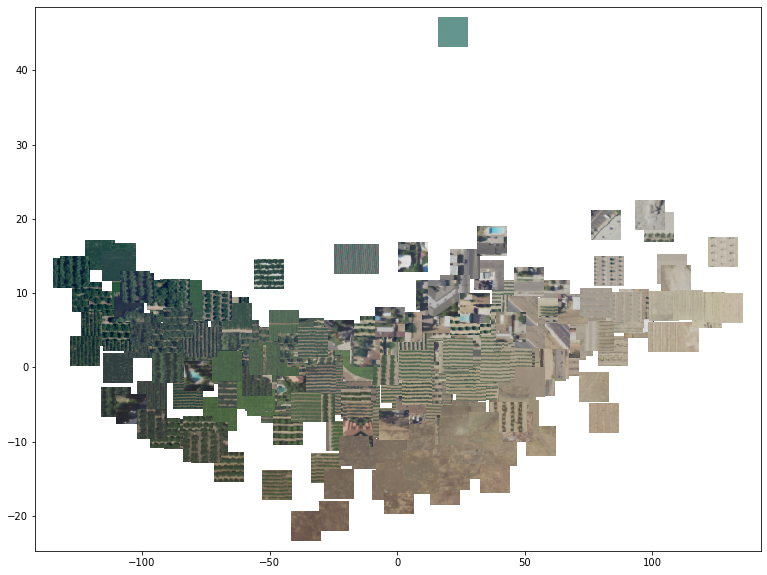

In [122]:
# Plot the subset of images in a two dimensional representation
n_imgs = 350
#img_shape = (256, 256)
img_shape = (300, 300)

def imscatter(x, y, images, ax=None, zoom=0.1):
    ax = plt.gca()
    images = [OffsetImage(image, zoom=zoom) for image in images]
    artists = []
    for x0, y0, im0 in zip(x, y, images):
        ab = AnnotationBbox(im0, (x0, y0), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(np.column_stack([x, y]))
    ax.autoscale()

plt.figure(figsize=(13,10))
imscatter(pca_MeanColorSpace[0:n_imgs,0], pca_MeanColorSpace[0:n_imgs,1], [cv2.resize(np.load(os.path.join(TILE2VEC_DIR, '{}tile.npy'.format(i+1)))[:,:,:3], img_shape) for i in range(n_imgs)])

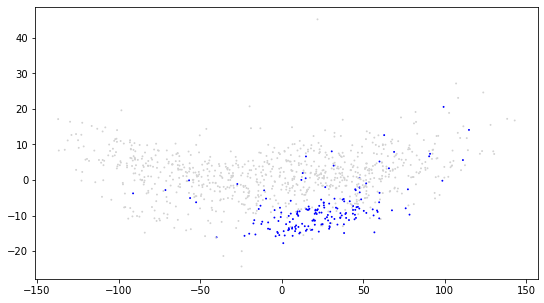

In [123]:
color = []
for i in range(len(y_train)):
    if y_train[i] == 176:
        color.append('b') #
    else:
        color.append('lightgrey') #other

plt.figure(figsize=(9,5))
plt.scatter(pca_MeanColorSpace[:, 0], pca_MeanColorSpace[:, 1], c=color, s=0.8, cmap='Scatter');

### UMAP

In [42]:
#umap_bigearthnet = umap.UMAP(
#    n_neighbors=100,
#    min_dist=0.0,
#    n_components=2,
#    random_state=42,
#).fit_transform(features_bigearthnet)

In [124]:
UMAP_TILE2VEC = os.path.abspath("../data/features/tile2vec/UMAP")

umap_bigearthnet = np.load(os.path.join(UMAP_TILE2VEC, 'umap_bigearthnet_tile2vec.npy'))
umap_EuroSAT = np.load(os.path.join(UMAP_TILE2VEC, 'umap_EuroSAT_tile2vec.npy'))
umap_ResNet50 = np.load(os.path.join(UMAP_TILE2VEC, 'umap_ResNet50_tile2vec.npy'))
umap_Resic45 = np.load(os.path.join(UMAP_TILE2VEC, 'umap_Resic45_tile2vec.npy'))
umap_So2Sat = np.load(os.path.join(UMAP_TILE2VEC, 'umap_So2Sat_tile2vec.npy'))
umap_Tile2Vec = np.load(os.path.join(UMAP_TILE2VEC, 'umap_Tile2Vec_tile2vec.npy'))
umap_UCMerced = np.load(os.path.join(UMAP_TILE2VEC, 'umap_UCMerced_tile2vec.npy'))
umap_InceptionV3 = np.load(os.path.join(UMAP_TILE2VEC, 'umap_InceptionV3_tile2vec.npy'))
umap_CannyEdgeSpace = np.load(os.path.join(UMAP_TILE2VEC, 'umap_CannyEdgeSpace_tile2vec.npy'))
umap_MeanColorSpace = np.load(os.path.join(UMAP_TILE2VEC, 'umap_MeanColorSpace_tile2vec.npy'))

##### BigEarthNet

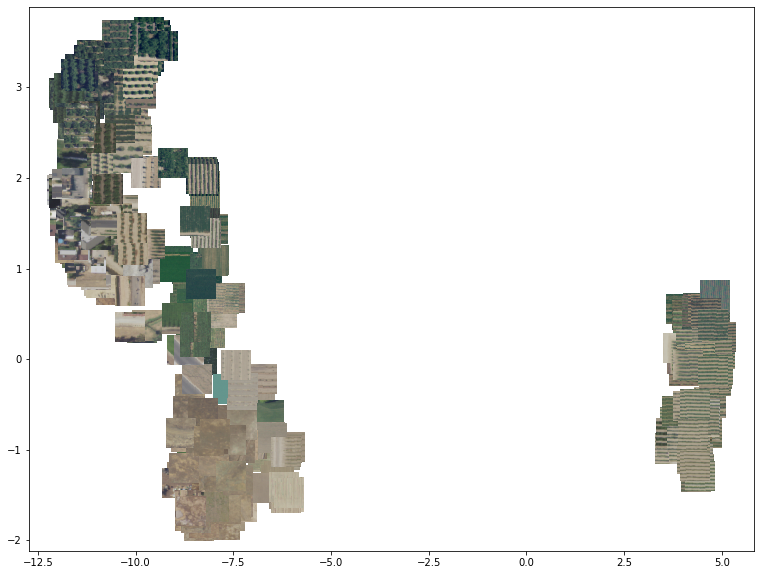

In [126]:
# Plot the subset of images in a two dimensional representation
n_imgs = 350
#img_shape = (256, 256)
img_shape = (300, 300)

def imscatter(x, y, images, ax=None, zoom=0.1):
    ax = plt.gca()
    images = [OffsetImage(image, zoom=zoom) for image in images]
    artists = []
    for x0, y0, im0 in zip(x, y, images):
        ab = AnnotationBbox(im0, (x0, y0), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(np.column_stack([x, y]))
    ax.autoscale()

plt.figure(figsize=(13,10))
imscatter(umap_bigearthnet[0:n_imgs,0], umap_bigearthnet[0:n_imgs,1], [cv2.resize(np.load(os.path.join(TILE2VEC_DIR, '{}tile.npy'.format(i+1)))[:,:,:3], img_shape) for i in range(n_imgs)])

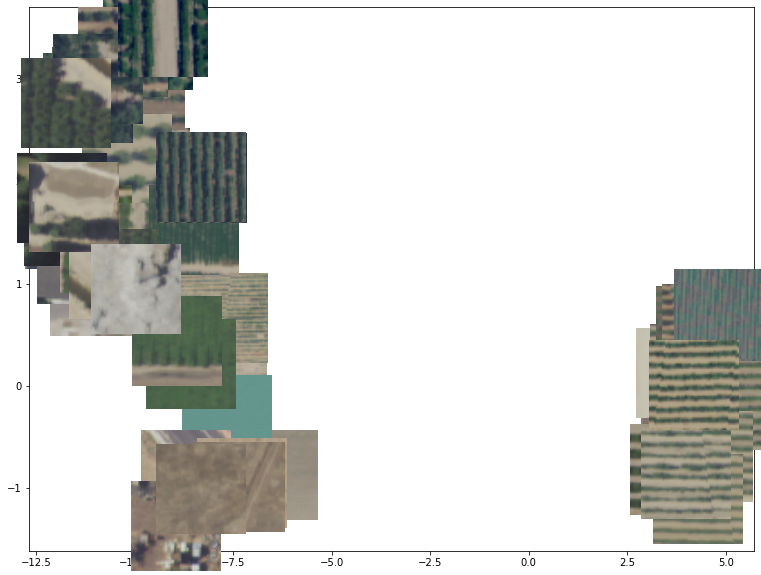

In [127]:
# Subset of images for clustering
n_imgs = 60
offset = 200

# Plot the subset of images in a two dimensional representation
def imscatter(x, y, images, ax=None, zoom=0.3):
    ax = plt.gca()
    images = [OffsetImage(image, zoom=zoom) for image in images]
    artists = []
    for x0, y0, im0 in zip(x, y, images):
        ab = AnnotationBbox(im0, (x0, y0), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(np.column_stack([x, y]))
    ax.autoscale()

plt.figure(figsize=(13,10))
imscatter(umap_bigearthnet[offset:offset + n_imgs, 0], umap_bigearthnet[offset:offset + n_imgs, 1], [cv2.resize(np.load(os.path.join(TILE2VEC_DIR, '{}tile.npy'.format(offset+i+1)))[:,:,:3], img_shape) for i in range(n_imgs)])

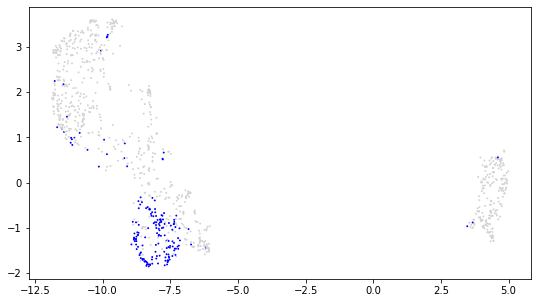

In [128]:
color = []
for i in range(len(y_train)):
    if y_train[i] == 176:
        color.append('b') #
    else:
        color.append('lightgrey') #other

plt.figure(figsize=(9,5))
plt.scatter(umap_bigearthnet[:, 0], umap_bigearthnet[:, 1], c=color, s=0.8, cmap='Scatter');

##### EuroSAT

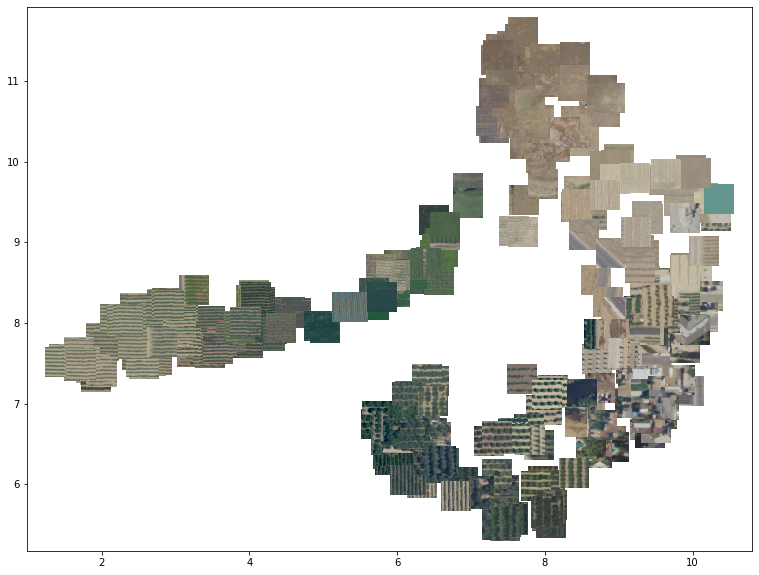

In [129]:
# Plot the subset of images in a two dimensional representation
n_imgs = 350
#img_shape = (256, 256)
img_shape = (300, 300)

def imscatter(x, y, images, ax=None, zoom=0.1):
    ax = plt.gca()
    images = [OffsetImage(image, zoom=zoom) for image in images]
    artists = []
    for x0, y0, im0 in zip(x, y, images):
        ab = AnnotationBbox(im0, (x0, y0), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(np.column_stack([x, y]))
    ax.autoscale()

plt.figure(figsize=(13,10))
imscatter(umap_EuroSAT[0:n_imgs,0], umap_EuroSAT[0:n_imgs,1], [cv2.resize(np.load(os.path.join(TILE2VEC_DIR, '{}tile.npy'.format(i+1)))[:,:,:3], img_shape) for i in range(n_imgs)])

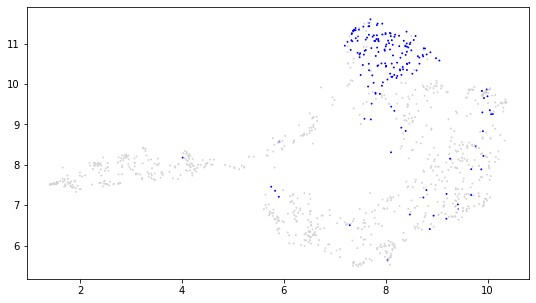

In [130]:
color = []
for i in range(len(y_train)):
    if y_train[i] == 176:
        color.append('b') #
    else:
        color.append('lightgrey') #other

plt.figure(figsize=(9,5))
plt.scatter(umap_EuroSAT[:, 0], umap_EuroSAT[:, 1], c=color, s=0.8, cmap='Scatter');

##### ResNet50

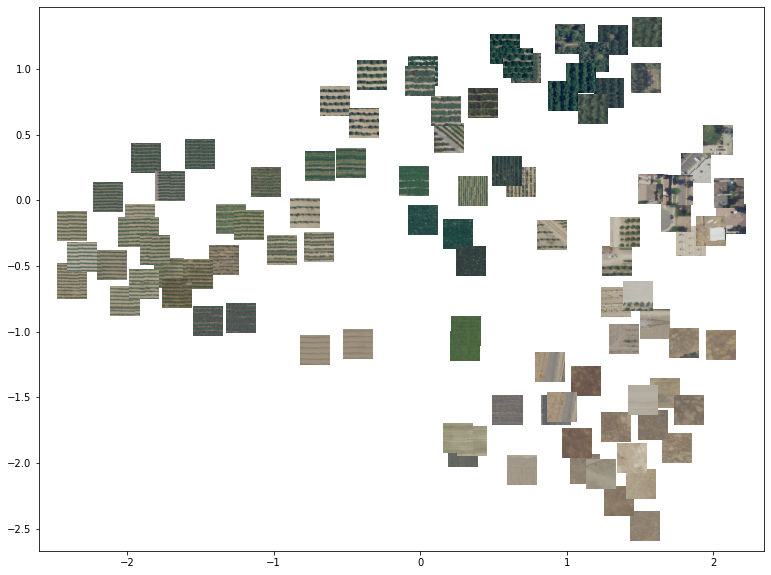

In [131]:
# Plot the subset of images in a two dimensional representation
n_imgs = 350
#img_shape = (256, 256)
img_shape = (300, 300)

def imscatter(x, y, images, ax=None, zoom=0.1):
    ax = plt.gca()
    images = [OffsetImage(image, zoom=zoom) for image in images]
    artists = []
    for x0, y0, im0 in zip(x, y, images):
        ab = AnnotationBbox(im0, (x0, y0), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(np.column_stack([x, y]))
    ax.autoscale()

plt.figure(figsize=(13,10))
imscatter(umap_ResNet50[0:n_imgs,0], umap_ResNet50[0:n_imgs,1], [cv2.resize(np.load(os.path.join(TILE2VEC_DIR, '{}tile.npy'.format(i+1)))[:,:,:3], img_shape) for i in range(n_imgs)])

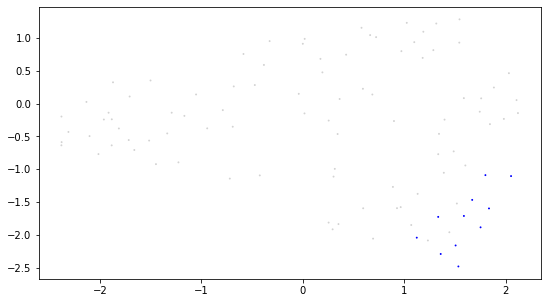

In [133]:
color = []
for i in range(len(y_train)):
    if y_train[i] == 176:
        color.append('b') #
    else:
        color.append('lightgrey') #other

plt.figure(figsize=(9,5))
plt.scatter(umap_ResNet50[:, 0], umap_ResNet50[:, 1], c=color[:100], s=0.8, cmap='Scatter');

##### Resic45

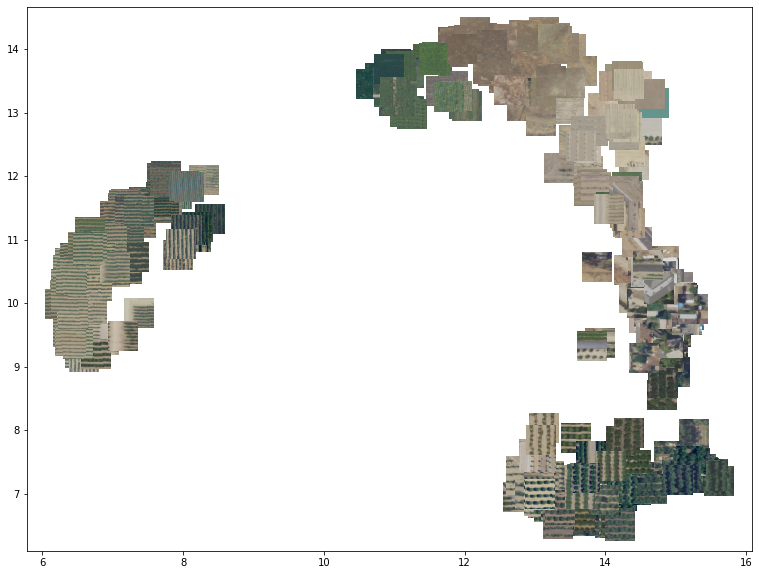

In [134]:
# Plot the subset of images in a two dimensional representation
n_imgs = 350
#img_shape = (256, 256)
img_shape = (300, 300)

def imscatter(x, y, images, ax=None, zoom=0.1):
    ax = plt.gca()
    images = [OffsetImage(image, zoom=zoom) for image in images]
    artists = []
    for x0, y0, im0 in zip(x, y, images):
        ab = AnnotationBbox(im0, (x0, y0), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(np.column_stack([x, y]))
    ax.autoscale()

plt.figure(figsize=(13,10))
imscatter(umap_Resic45[0:n_imgs,0], umap_Resic45[0:n_imgs,1], [cv2.resize(np.load(os.path.join(TILE2VEC_DIR, '{}tile.npy'.format(i+1)))[:,:,:3], img_shape) for i in range(n_imgs)])

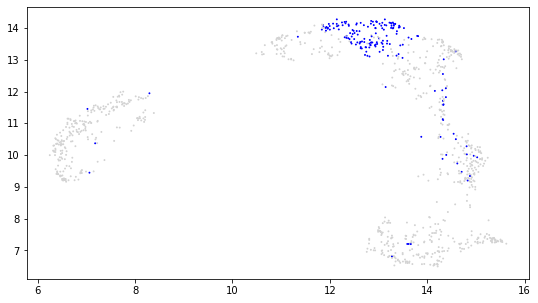

In [135]:
color = []
for i in range(len(y_train)):
    if y_train[i] == 176:
        color.append('b') #
    else:
        color.append('lightgrey') #other

plt.figure(figsize=(9,5))
plt.scatter(umap_Resic45[:, 0], umap_Resic45[:, 1], c=color, s=0.8, cmap='Scatter');

##### So2Sat

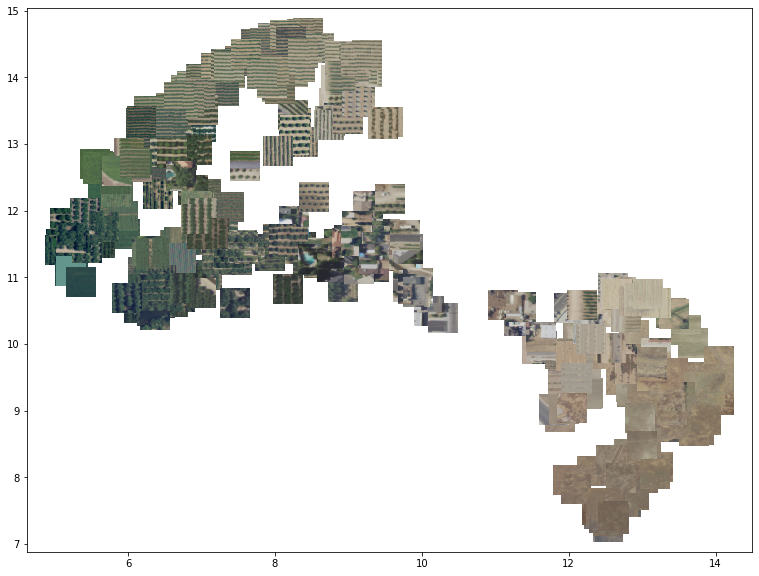

In [136]:
# Plot the subset of images in a two dimensional representation
n_imgs = 350
#img_shape = (256, 256)
img_shape = (300, 300)

def imscatter(x, y, images, ax=None, zoom=0.1):
    ax = plt.gca()
    images = [OffsetImage(image, zoom=zoom) for image in images]
    artists = []
    for x0, y0, im0 in zip(x, y, images):
        ab = AnnotationBbox(im0, (x0, y0), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(np.column_stack([x, y]))
    ax.autoscale()

plt.figure(figsize=(13,10))
imscatter(umap_So2Sat[0:n_imgs,0], umap_So2Sat[0:n_imgs,1], [cv2.resize(np.load(os.path.join(TILE2VEC_DIR, '{}tile.npy'.format(i+1)))[:,:,:3], img_shape) for i in range(n_imgs)])

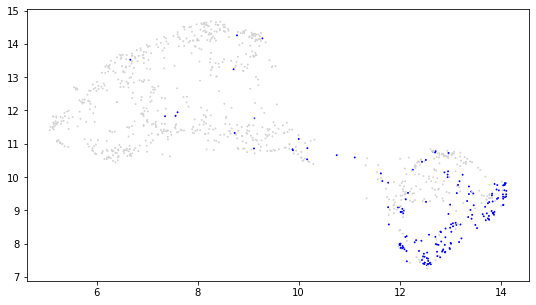

In [137]:
color = []
for i in range(len(y_train)):
    if y_train[i] == 176:
        color.append('b') #
    else:
        color.append('lightgrey') #other

plt.figure(figsize=(9,5))
plt.scatter(umap_So2Sat[:, 0], umap_So2Sat[:, 1], c=color, s=0.8, cmap='Scatter');

##### Tile2Vec

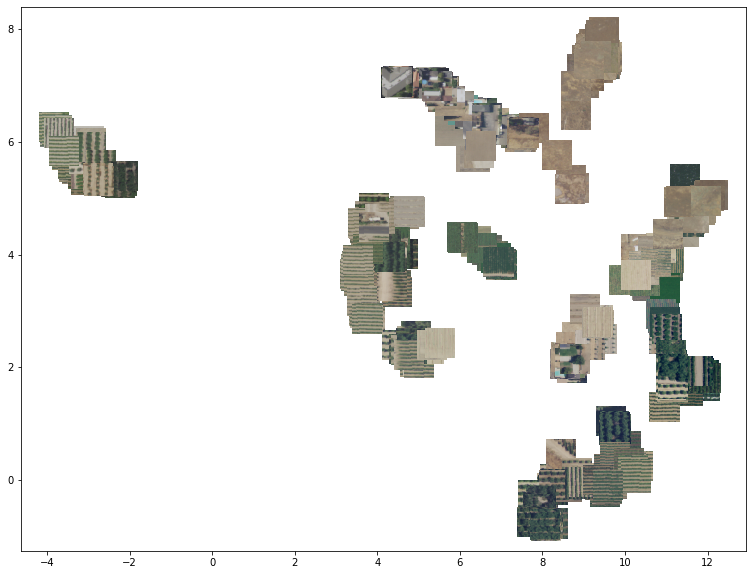

In [139]:
# Plot the subset of images in a two dimensional representation
n_imgs = 350
#img_shape = (256, 256)
img_shape = (300, 300)

def imscatter(x, y, images, ax=None, zoom=0.1):
    ax = plt.gca()
    images = [OffsetImage(image, zoom=zoom) for image in images]
    artists = []
    for x0, y0, im0 in zip(x, y, images):
        ab = AnnotationBbox(im0, (x0, y0), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(np.column_stack([x, y]))
    ax.autoscale()

plt.figure(figsize=(13,10))
imscatter(umap_Tile2Vec[0:n_imgs,0], umap_Tile2Vec[0:n_imgs,1], [cv2.resize(np.load(os.path.join(TILE2VEC_DIR, '{}tile.npy'.format(i+1)))[:,:,:3], img_shape) for i in range(n_imgs)])

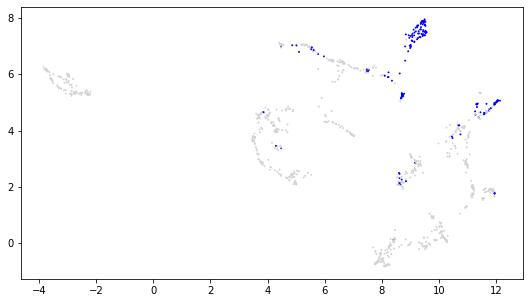

In [140]:
color = []
for i in range(len(y_train)):
    if y_train[i] == 176:
        color.append('b') #
    else:
        color.append('lightgrey') #other

plt.figure(figsize=(9,5))
plt.scatter(umap_Tile2Vec[:, 0], umap_Tile2Vec[:, 1], c=color, s=0.8, cmap='Scatter');

##### UC Merced

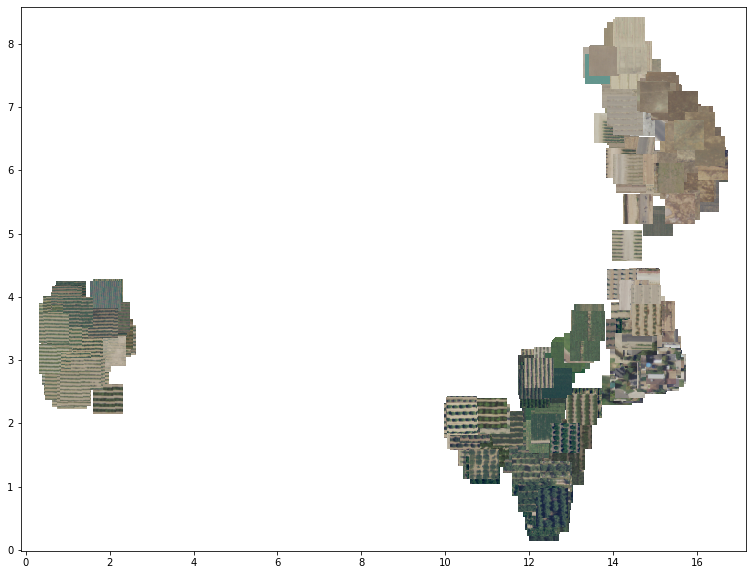

In [141]:
# Plot the subset of images in a two dimensional representation
n_imgs = 350
#img_shape = (256, 256)
img_shape = (300, 300)

def imscatter(x, y, images, ax=None, zoom=0.1):
    ax = plt.gca()
    images = [OffsetImage(image, zoom=zoom) for image in images]
    artists = []
    for x0, y0, im0 in zip(x, y, images):
        ab = AnnotationBbox(im0, (x0, y0), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(np.column_stack([x, y]))
    ax.autoscale()

plt.figure(figsize=(13,10))
imscatter(umap_UCMerced[0:n_imgs,0], umap_UCMerced[0:n_imgs,1], [cv2.resize(np.load(os.path.join(TILE2VEC_DIR, '{}tile.npy'.format(i+1)))[:,:,:3], img_shape) for i in range(n_imgs)])

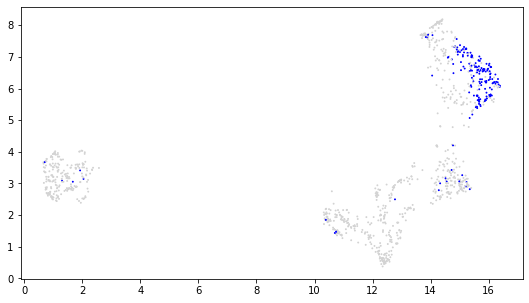

In [142]:
color = []
for i in range(len(y_train)):
    if y_train[i] == 176:
        color.append('b') #
    else:
        color.append('lightgrey') #other

plt.figure(figsize=(9,5))
plt.scatter(umap_UCMerced[:, 0], umap_UCMerced[:, 1], c=color, s=0.8, cmap='Scatter');

##### InceptionV3

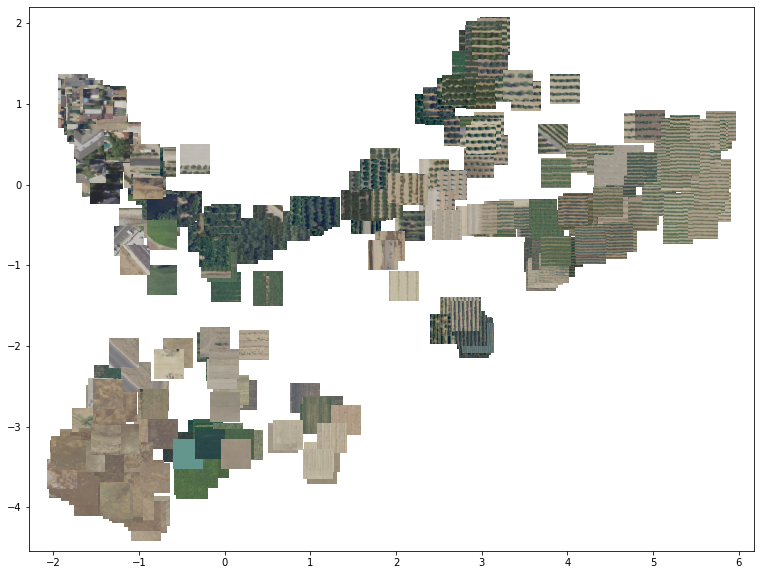

In [143]:
# Plot the subset of images in a two dimensional representation
n_imgs = 350
#img_shape = (256, 256)
img_shape = (300, 300)

def imscatter(x, y, images, ax=None, zoom=0.1):
    ax = plt.gca()
    images = [OffsetImage(image, zoom=zoom) for image in images]
    artists = []
    for x0, y0, im0 in zip(x, y, images):
        ab = AnnotationBbox(im0, (x0, y0), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(np.column_stack([x, y]))
    ax.autoscale()

plt.figure(figsize=(13,10))
imscatter(umap_InceptionV3[0:n_imgs,0], umap_InceptionV3[0:n_imgs,1], [cv2.resize(np.load(os.path.join(TILE2VEC_DIR, '{}tile.npy'.format(i+1)))[:,:,:3], img_shape) for i in range(n_imgs)])

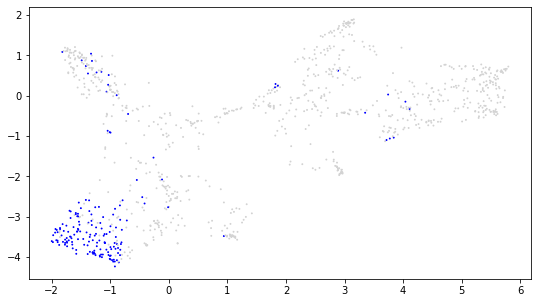

In [144]:
color = []
for i in range(len(y_train)):
    if y_train[i] == 176:
        color.append('b') #
    else:
        color.append('lightgrey') #other

plt.figure(figsize=(9,5))
plt.scatter(umap_InceptionV3[:, 0], umap_InceptionV3[:, 1], c=color, s=0.8, cmap='Scatter');

##### CannyEdgeSpace

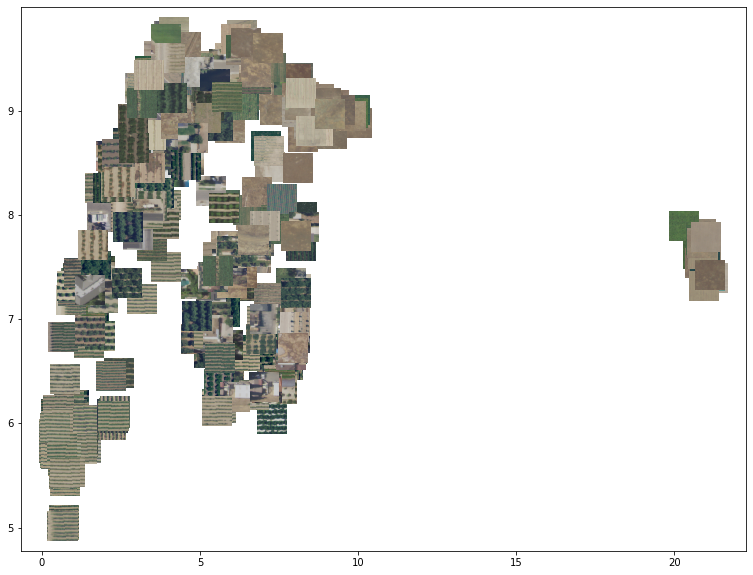

In [145]:
# Plot the subset of images in a two dimensional representation
n_imgs = 350
#img_shape = (256, 256)
img_shape = (300, 300)

def imscatter(x, y, images, ax=None, zoom=0.1):
    ax = plt.gca()
    images = [OffsetImage(image, zoom=zoom) for image in images]
    artists = []
    for x0, y0, im0 in zip(x, y, images):
        ab = AnnotationBbox(im0, (x0, y0), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(np.column_stack([x, y]))
    ax.autoscale()

plt.figure(figsize=(13,10))
imscatter(umap_CannyEdgeSpace[0:n_imgs,0], umap_CannyEdgeSpace[0:n_imgs,1], [cv2.resize(np.load(os.path.join(TILE2VEC_DIR, '{}tile.npy'.format(i+1)))[:,:,:3], img_shape) for i in range(n_imgs)])

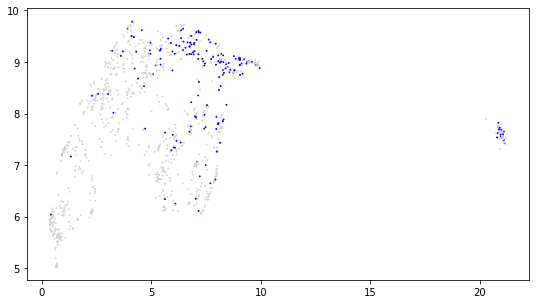

In [146]:
color = []
for i in range(len(y_train)):
    if y_train[i] == 176:
        color.append('b') #
    else:
        color.append('lightgrey') #other

plt.figure(figsize=(9,5))
plt.scatter(umap_CannyEdgeSpace[:, 0], umap_CannyEdgeSpace[:, 1], c=color, s=0.8, cmap='Scatter');

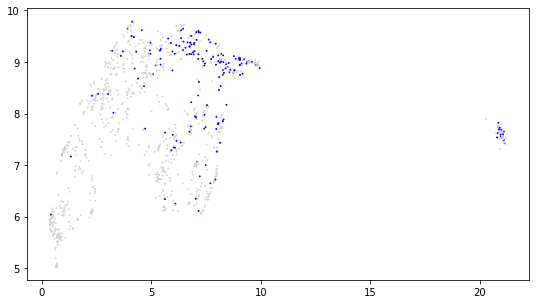

In [147]:
color = []
for i in range(len(y_train)):
    if y_train[i] == 176:
        color.append('b') #
    else:
        color.append('lightgrey') #other

plt.figure(figsize=(9,5))
plt.scatter(umap_CannyEdgeSpace[:, 0], umap_CannyEdgeSpace[:, 1], c=color, s=0.8, cmap='Scatter');

## Accuracies

In [149]:
# Splits of the original Tile2Vec dataset for training, validation and testing
SPLIT_TRAIN = 700
SPLIT_VALIDATE = 800

In [150]:
# Define label mappings for Snorkle voting for convenience
NEGATIVE = 0
POSITIVE = 1
ABSTAIN = -1

In [227]:
y_test = y_train[SPLIT_VALIDATE:]
y_valid = y_train[SPLIT_TRAIN:SPLIT_VALIDATE]
y_train = y_train[:SPLIT_TRAIN]

print(y_train.shape[0])
print(y_valid.shape[0])
print(y_test.shape[0])

700
100
200


In [229]:
def namestr(obj, namespace):
    return [name for name in namespace if namespace[name] is obj]

def evaluate_LF(LF, y_test, tag, n=100, full_dataset = False, print_evaluation=True):
    #print(namestr(LF, globals()))
    
    if full_dataset:
        n = y_test.shape[0]

    # Evaluate
    tp, fp, tn, fn = 0, 0, 0, 0
    abst = 0
    for idx in range(n):
        pred = LF(idx)
        if pred == 1: 
            if y_test[idx] == label_dict[tag]:
                tp += 1
            else:
                fp += 1
        elif pred == 0:
            if y_test[idx] != label_dict[tag]:
                tn += 1
            else:
                fn += 1
        else:
            abst += 1  

    # Calculate the accuracy of LF
    accuracy = (tp + tn)/(tp + fp + tn + fn)
    precision = tp / (tp + fp)
    coverage = (n - abst) / n
    
    if print_evaluation:
        print('TP: ', tp)
        print('FP: ', fp)
        print('TN: ', tn)
        print('FN: ', fn)
        print('abstain: ', abst)
        print('accuracy: ', accuracy)
        print('precision: ', precision)
        print('coverage: ', coverage)
        
    return

### UMAP

In [206]:
# Set polygons within UMAP embedding to cluster/label data for selected labels

label_dict = {}
for i in range(len(unique)):
    label_dict[i] = unique[i]

print(label_dict)

# TBD: more precise polygons/bounding boxes including abstaining regions

from shapely.geometry import Point, Polygon

umap_bigearthnet_coords = [[] for i in range(len(unique))]
umap_bigearthnet_coords[20] = [(-9, -2.3), (-9, -0.6), (-7, -0.6), (-7, -2.3)]


umap_InceptionV3_coords = [[] for i in range(len(unique))]
umap_InceptionV3_coords[20] = [(-2.1, -5), (-2.1, -2.3), (-0.7, -2.3), (-0.7, -5)]


{0: 1.0, 1: 2.0, 2: 21.0, 3: 24.0, 4: 28.0, 5: 36.0, 6: 49.0, 7: 54.0, 8: 61.0, 9: 69.0, 10: 71.0, 11: 72.0, 12: 75.0, 13: 76.0, 14: 111.0, 15: 121.0, 16: 122.0, 17: 123.0, 18: 124.0, 19: 152.0, 20: 176.0, 21: 204.0, 22: 205.0, 23: 208.0, 24: 212.0, 25: 217.0, 26: 225.0, 27: 236.0}


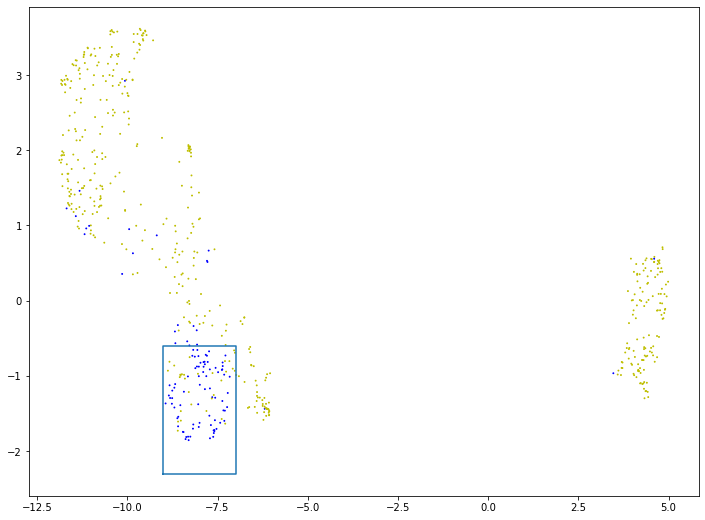

In [207]:
# Display manual clustering of the UMAP embedding

label_id = 20
no_samples = 600

coords = umap_bigearthnet_coords[label_id]
poly = Polygon(coords)

color = []
#for i in range(len(y_train)):
for i in range(no_samples):
    if y_train[i] == label_dict[label_id]:
        color.append('b') #
    else:
        color.append('y') #other

plt.figure(figsize=(12,9))
plt.scatter(umap_bigearthnet[:no_samples, 0], umap_bigearthnet[:no_samples, 1], c=color, s=0.8, cmap='Scatter')
plt.plot(*poly.exterior.xy)

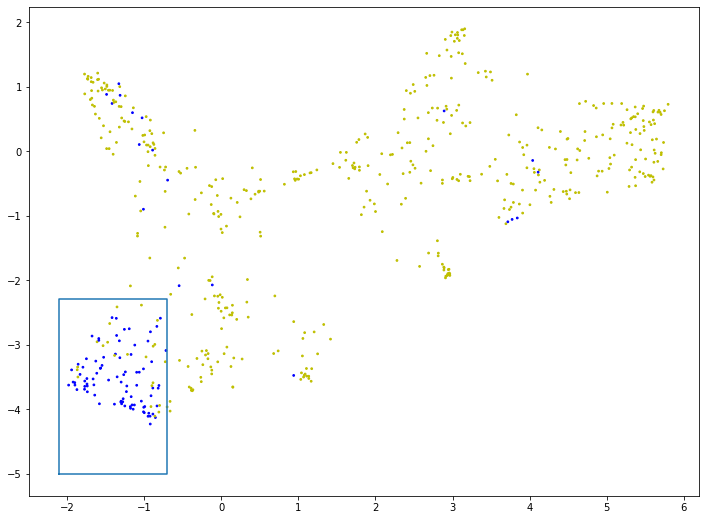

In [208]:
# Display manual clustering of the UMAP embedding

label_id = 20
no_samples = 600

coords = umap_InceptionV3_coords[label_id]
poly = Polygon(coords)

color = []
#for i in range(len(y_train)):
for i in range(no_samples):
    if y_train[i] == label_dict[label_id]:
        color.append('b') #
    else:
        color.append('y') #other

plt.figure(figsize=(12,9))
plt.scatter(umap_InceptionV3[:no_samples, 0], umap_InceptionV3[:no_samples, 1], c=color, s=3, cmap='Scatter')
plt.plot(*poly.exterior.xy)

In [209]:
def grassland_bigearthnet_umap(x):
    i = int(x)
    
    p1 = Point(umap_bigearthnet[i, 0], umap_bigearthnet[i, 1])
    coord = umap_bigearthnet_coords[20]
    poly = Polygon(coord)
    
    if p1.within(poly):
        return POSITIVE
    else:
        return NEGATIVE

In [230]:
evaluate_LF(grassland_bigearthnet_umap, y_test, 20, full_dataset = False)

TP:  10
FP:  7
TN:  62
FN:  21
abstain:  0
accuracy:  0.72
precision:  0.5882352941176471
coverage:  1.0


In [233]:
def grassland_InceptionV3_umap(x):
    i = int(x)
    
    p1 = Point(umap_InceptionV3[i, 0], umap_InceptionV3[i, 1])
    coord = umap_InceptionV3_coords[20]
    poly = Polygon(coord)
    
    if p1.within(poly):
        return POSITIVE
    else:
        return NEGATIVE

In [234]:
evaluate_LF(grassland_InceptionV3_umap, y_test, 20, full_dataset = False)

TP:  8
FP:  7
TN:  62
FN:  23
abstain:  0
accuracy:  0.7
precision:  0.5333333333333333
coverage:  1.0
